<img src="../figures/header.jpg" style="display:block; margin:auto; width:55%; height:210px;">

<br><br> 

<p style="text-align:center; background-color: darkgray; color: lightyellow; border-radius:10px; line-height:1.4; font-size:32px; font-weight:bold; padding: 9px;">
            <strong>Dog Breed Image Classification</strong>
</p>  
  
<p style="text-align:center; color: Black; border-radius:10px; font-family:helvetica; line-height:1.0; font-size:28px; font-weight:normal; text-transform: capitalize; padding: 5px;">
    End-to-end Deep Learning Project for
    <br>Dog Breed Multi-Class Image Classification:
    <br>EDA, Transfer Learning, Fine-Tuning, and Model Deployment
</p>    

# 1. Introduction

## 1.1 Background

In recent years, the canine population has witnessed a surge in the number of mixed-breed dogs. While the charm of mixed-breed dogs lies in their one-of-a-kind characteristics, the increasing variety poses challenges when it comes to identifying their specific breeds. This is where a classification model proves to be invaluable.

Creating a classification model for identifying breeds of dogs can serve various purposes including:
- Lost and found services to help efficiently reunite lost dogs with owners.
- Educational tools through interactive websites or mobile applications to learn about different breeds.
- Pet adoption platforms to identify breeds within shelters, enhancing adoptiong and rehoming processes.
- Dog shows and competitions to assist judges in verifying participating dog breeds.

The following study explores the multi-class [stanford dogs image dataset](https://www.kaggle.com/datasets/jessicali9530/stanford-dogs-dataset), then uses transfer learning to train and fine-tune four modern neural network architectures. We'll use built-in [Keras applications](https://keras.io/api/applications) to use architectures with pre-trained ImageNet weights for the following models: 
- [xception](https://arxiv.org/abs/1610.02357)
- [InceptionResNetV2](https://arxiv.org/abs/1602.07261)
- [EfficientNetB3](https://arxiv.org/abs/1905.11946)
- [ConvNeXtSmall](https://arxiv.org/abs/2201.03545)

In the accompanying [deployment_notebook](deployment_notebook), we show:
- **Serverless Deployment**: Save the best model with tensorflow lite, create a docker image for the environment with minimized dependencies, and deploy it to the cloud using AWS Lambda
- **Kubernetes Deployment**: Convert the model to tensorflow format, set up a flask application, build docker images for them, and deploy the full application to AWS EKS. 
- **Front-end Application**: Create a low-code front-end for our application using streamlit and connect it to the cloud-deployed AWS services.

The full framework for that you will complete through both notebooks for this project is shown below:

<img src="../figures/dog-prediction-framework.png" width="700">


**WARNING**: Do not attempt to run the entire notebook without a GPU with at least 8GB of memory. The models may take hours or even days to train. See section 2.3 for more information on how to check for an available GPU.

## 1.2 Table of Contents.

### 1. Introduction
- 1.1 - Description of the project methodology and real world use-case.
- 1.2 - Table of contents **(We Are Here)**
- 1.3 - Repository structure
- 1.4 - Dataset source and information.
### 2. Dependency Management
- 2.1 - Includes instructions and code-blocks for both creating and running the conda environment, including tensorflow installation.
- 2.2 - Import statements for all dependencies. This section **must** be run before executing the rest of the project.
- 2.3 - Check for GPU available on Tensorflow
   - Please check that all output on your local machine before proceeding.
### 3. EDA and Data Prep
- 3.1 - Preparing the data for Keras model training
   - Run this section before proceeding.
- 3.2 - Exploring the stanford dogs dataset
### 4. Modeling
- 4.1 - Helper functions for compiling models and plotting output. This section must be run before any of 5.2 through 5.6.
- Training, fine-tuning and saving models for:
    - 4.2 - xception
    - 4.3 - InceptionResNetV2
    - 4.4 - EfficientNetB3
    - 4.5 - ConvNeXtSmall
- 4.6 - Comparison and analysis of all four tuned models to determine the final model: EfficientNetB3V2
- 4.7 - Save trained EfficientNetB3V2 model to tflite for deployment
### 5. References
   - References for all model architectures and Keras documentation

## 1.3 Repository Structure

```
dog-prediction
│   README.md
|   Dockerfile - Set up environment with minimized dependencies for local and cloud deployment
│   requirements.txt - Set up local environment for running notebook
│
└───data - Unzip the dataset to this folder (section 2.3)
│   
└───figures - Contains images for the notebook and readme
|
└───models
|   │   effnetV2B3_model.keras
|   │   Xception_model.keras
|   │   model.tflite - Minimized dependencies for local and cloud deployment
|   │   converted_model - Tensorflow model for kubernetes deployment with tf-serving
|
└───python
|   │   convnext.py - Hotfix for saving convnext models with tensorflow 2.10
|   │   lambda_function.py - Function for AWS Lambda cloud deployment
|   │   notebook.ipynb - EDA, modeling and hyperparameter tuning - training output removed
|   │   notebook-orig.ipynb - EDA, modeling and hyperparameter tuning - training output kept
|   │   test.py - Tests serverless local and cloud inference
|   │   streamlit_app.py - Application for streamlit cloud
|
└───kubernetes
    │   docker-compose.yaml - Docker Compose file for setting up multi-container network
    │   image-gateway.dockerfile - Dockerfile for running gateway container to post predictions to the model
    │   image-model.dockerfile - Dockerfile for running model container to accept posts for predictions
    │   Pipfile - Pipfile for building gateway container environment
    │   Pipfile.lock - Pipfile lock for building gateway container environment
    │   gateway.py - Flask application that connects to tf-serving model
    │   proto.py - Converts model to proto for efficient deployment and inference
    │   test.py - Tests kubernetes local and cloud inference

```

## 1.4 Dataset Source

The Stanford Dogs dataset contain images of dogs from around the world. It is primarily used for image categorization of dog breeds. The version for this project can be downloaded from [Kaggle - Stanford Dogs Dataset](https://www.kaggle.com/datasets/jessicali9530/stanford-dogs-dataset).
- Dog breeds: 120
- Number of images: 20,580
- This project uses the "Images" folder which is divided into subfolders by class (dog breed)

Further observation of the data can be found in section 3.2 EDA

# 2. Dependency Management

## 2.1 Environment Installation

### Creating conda environment from requirements.txt
The following will create a conda environment with the necessary requirements for this project. The following code is **not executable** within this notebook, but should be run prior to opening the notebook.

``conda create --name dog-prediction python=3.10``

``conda activate dog-prediction``

``pip install -r requirements.txt``

This project was created with tensorflow 2.10.0 with GPU support for windows cuda tool kit 11.2 and nvidia cuda-nvcc. The tensorflow installation for your OS may be different. Please refer to the [official documentation](https://www.tensorflow.org/install/pip). For a windows build with a cuda-enabled nvidia graphics card, please run the following commands.

In [1]:
#!conda install -c conda-forge cudatoolkit=11.2 cudnn=8.1.0
#!conda install -c nvidia cuda-nvcc

### Writing requirements.txt or environment.yml
If needed, the requirements file can be re-written to the root of the repository with the following command.

``pip3 freeze > ../requirements.txt``

## 2.2 Import Statements

Ensure that your python version and package versions match the following notebook output before proceeding, as some versions of python, scikit-learn and tensorflow are incompatible with the project.

In [2]:
# modeling
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator
from keras import layers

# fixed functionality to save convnext models with tf 2.10
import convnext

# model analysis
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, recall_score, precision_score, f1_score
import numpy as np
import polars as pl 
from scipy.stats import kurtosis, skew

# plotting
import matplotlib as mpl
import matplotlib.pyplot as plt

# track model training times
import os
from time import time
from datetime import datetime

In [3]:
import session_info
session_info.show(html=False)

-----
convnext            NA
keras               2.10.0
matplotlib          3.8.2
numpy               1.26.4
polars              0.20.7
scipy               1.12.0
session_info        1.0.0
sklearn             1.4.0
tensorflow          2.10.1
-----
IPython             8.21.0
jupyter_client      8.6.0
jupyter_core        5.7.1
jupyterlab          4.1.0
-----
Python 3.10.13 | packaged by Anaconda, Inc. | (main, Sep 11 2023, 13:24:38) [MSC v.1916 64 bit (AMD64)]
Windows-10-10.0.19045-SP0
-----
Session information updated at 2024-02-18 11:08


## 2.3 GPU Availability

We also want to check that there is CUDA-enabled GPU on the current system. If the following output does not show a GPU device for your system, do **NOT** attempt to run the full notebook.

In [4]:
print("Available devices:")

for i, device in enumerate(tf.config.list_logical_devices()):
    print(f"{i}) {device}")

Available devices:
0) LogicalDevice(name='/device:CPU:0', device_type='CPU')
1) LogicalDevice(name='/device:GPU:0', device_type='GPU')


# 3. EDA and Data Prep

## 3.1 Data Prep

- Keras ImageDataGenerator from images directory
- Use scikit-learn train-test split into 80% train, 20% test data for final model comparison
- Further split train data into 80% train, 20% validation for hyperparameter tuning
- Convert 1D labels into one-hot arrays as the correct input format for Keras model training and testing
- We split the data twice:
  - First data split with smaller images (150x150) for faster hyperparameter tuning
  - Second data split with larger images (299x299) for final performance metrics and comparison between models

In [5]:
fpath = os.path.join('..', 'data', 'images', 'Images')
categories = os.listdir(fpath)
categories = [' '.join(' '.join(i.split('-')[1:]).split('_')).capitalize() for i in categories]

**First data split with smaller images (150x150) for faster hyperparameter tuning**

In [6]:
# use a keras generator to process all images in the directory
train_gen = ImageDataGenerator()

# gather all data from directories with small image size for efficient hyperparameter tuning
all_data = train_gen.flow_from_directory(
    fpath,
    target_size=(150, 150),
    batch_size=20580,
    shuffle=False
)
X, y = all_data.next()

# hold out 20% for testing at the end
X_train_hold, X_test, y_train_hold, y_test = train_test_split(X, all_data.labels, test_size=0.2, random_state=42)

# hold out 20% for validation during hyperparameter tuning
X_train, X_val, y_train, y_val = train_test_split(X_train_hold, y_train_hold, test_size=0.2, random_state=42)

# convert 1D label arrays to tensorflow one-hot vectors (keep them separate for printing EDA images)
y_train_tf = tf.one_hot(y_train, 120)
y_val_tf = tf.one_hot(y_val, 120)

Found 20580 images belonging to 120 classes.


**Second data split with larger images (299x299) for final performance metrics and comparison between models**

In [7]:
# use a keras generator to process all images in the directory
train_gen = ImageDataGenerator()

# gather all data from directories with small image size for efficient hyperparameter tuning
all_data_big = train_gen.flow_from_directory(
    fpath,
    target_size=(299, 299),
    batch_size=20580,
    shuffle=False
)
X_big, y_big = all_data_big.next()

# hold out 20% for testing at the end
X_train_big_hold, X_test_big, y_train_big_hold, y_test_big = train_test_split(X_big, all_data_big.labels, test_size=0.2, random_state=42)

# hold out 20% for validation during hyperparameter tuning
X_train_big, X_val_big, y_train_big, y_val_big = train_test_split(X_train_big_hold, y_train_big_hold, test_size=0.2, random_state=42)

# convert 1D label arrays to tensorflow one-hot vectors (keep them separate for printing final analysis images)
y_train_big_hold_tf = tf.one_hot(y_train_big_hold, 120)
y_test_big_tf = tf.one_hot(y_test_big, 120)

y_train_big_tf = tf.one_hot(y_train_big, 120)
y_val_big_tf = tf.one_hot(y_val_big, 120)

Found 20580 images belonging to 120 classes.


## 3.2 EDA

- List all possible classes (dog breeds)
- Print random images of dog breeds
- Barplots and statistical analysis of class distribution (min, max, mean, skew, kurtosis)
- Plot images of 5 most common and least common dog breeds from class distribution

In [8]:
print("List of categories = ",categories,"\n\nNo. of categories = ", len(categories))

List of categories =  ['Chihuahua', 'Japanese spaniel', 'Maltese dog', 'Pekinese', 'Shih tzu', 'Blenheim spaniel', 'Papillon', 'Toy terrier', 'Rhodesian ridgeback', 'Afghan hound', 'Basset', 'Beagle', 'Bloodhound', 'Bluetick', 'Black and tan coonhound', 'Walker hound', 'English foxhound', 'Redbone', 'Borzoi', 'Irish wolfhound', 'Italian greyhound', 'Whippet', 'Ibizan hound', 'Norwegian elkhound', 'Otterhound', 'Saluki', 'Scottish deerhound', 'Weimaraner', 'Staffordshire bullterrier', 'American staffordshire terrier', 'Bedlington terrier', 'Border terrier', 'Kerry blue terrier', 'Irish terrier', 'Norfolk terrier', 'Norwich terrier', 'Yorkshire terrier', 'Wire haired fox terrier', 'Lakeland terrier', 'Sealyham terrier', 'Airedale', 'Cairn', 'Australian terrier', 'Dandie dinmont', 'Boston bull', 'Miniature schnauzer', 'Giant schnauzer', 'Standard schnauzer', 'Scotch terrier', 'Tibetan terrier', 'Silky terrier', 'Soft coated wheaten terrier', 'West highland white terrier', 'Lhasa', 'Flat c

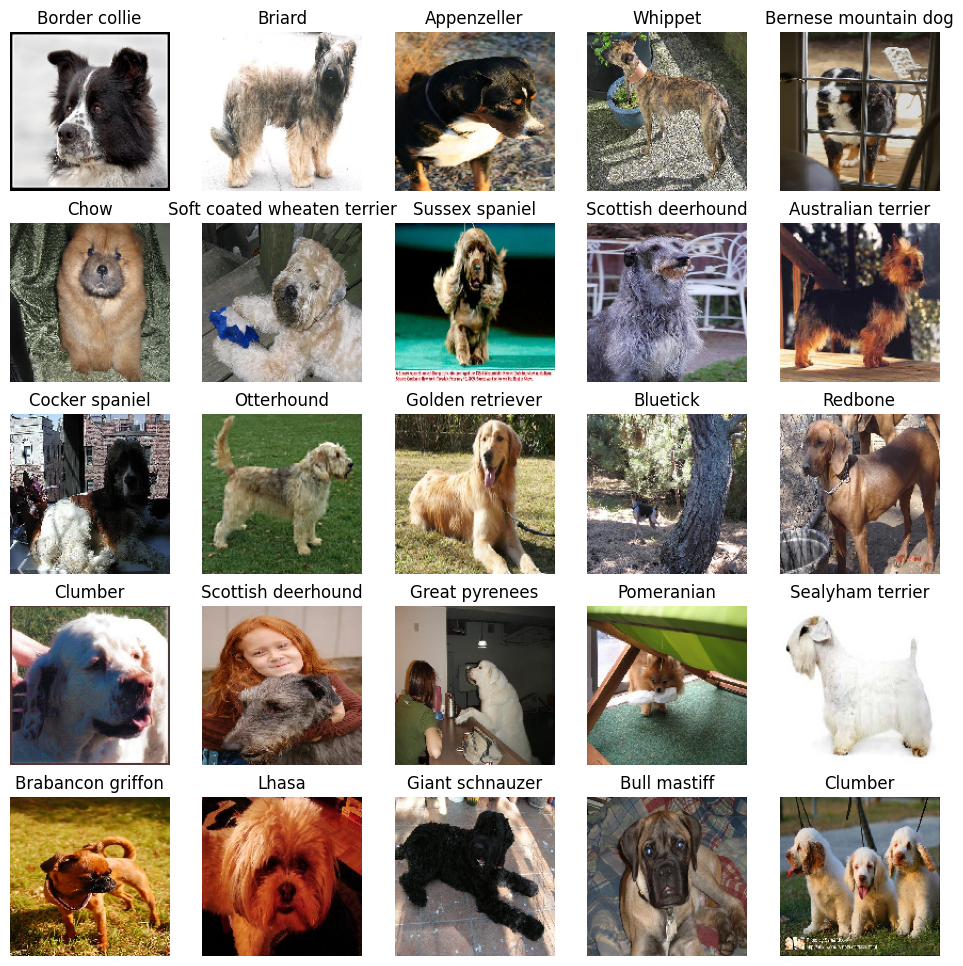

In [9]:
dims = 5
fig, axs = plt.subplots(dims,dims, figsize=(12,12))
count=0

# plot random images with labels (dog breeds) - these are random since our training data is shuffled
for x in range(dims):
    for y in range(dims):
        axs[x,y].axis("off")
        axs[x,y].imshow(np.array(X_train[count]).astype("uint8"))
        axs[x,y].set_title(categories[int(y_train[count])])
        count+=1

In [10]:
counts = np.unique(y_train, return_counts=True)[1]
num_classes = len(counts)
max_counts, min_counts = np.max(counts), np.min(counts)
sorted_counts = np.sort(counts)[::-1]

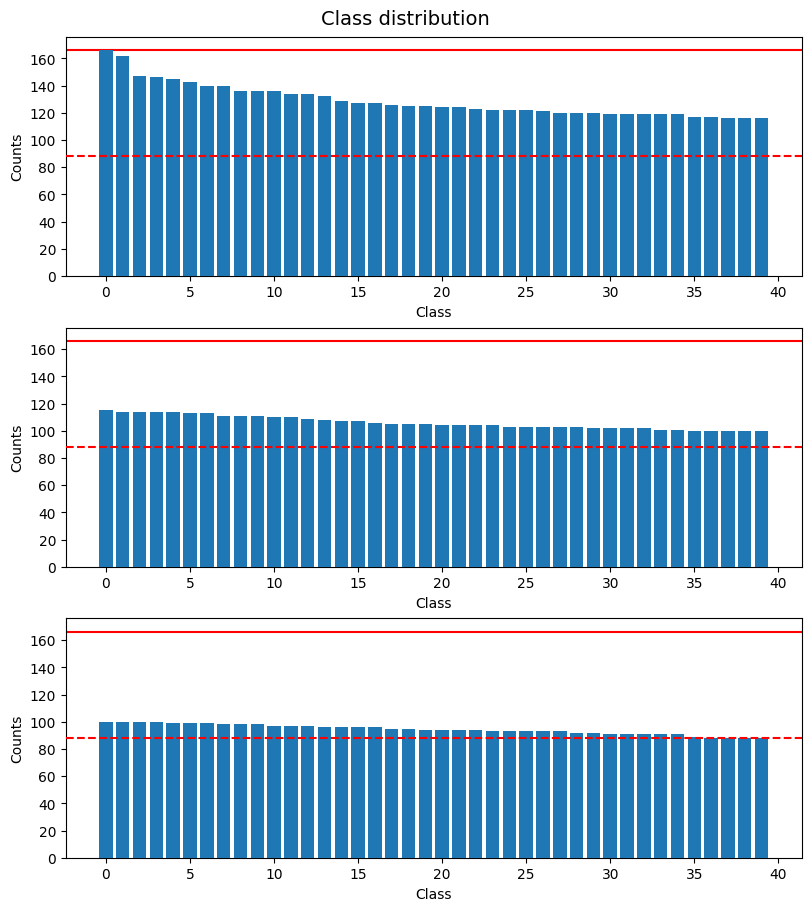

In [11]:
# bar chart showing distribution of classes
div = 40
num_plots = int(num_classes/div)
bin_sizes = np.arange(0, num_classes, div)
fig, axs = plt.subplots(num_plots,1, constrained_layout=True)
fig.set_size_inches(8, 3*num_plots)
fig.suptitle("Class distribution", fontsize=14)
plt.setp(axs, ylim=[0,max_counts+10], yticks=[0,20,40,60,80,100,120,140,160], xlabel="Class", ylabel="Counts")

for i in range(num_plots):
    div_counts = sorted_counts[bin_sizes[i]:bin_sizes[i]+div]
    axs[i].bar(range(div), div_counts, zorder=3)
    axs[i].axhline(y = max_counts, color = 'r') # max line
    axs[i].axhline(y = min_counts, color = 'r', linestyle='dashed', zorder=4) # min line

In [12]:
top_5_ind = np.argsort(counts)[-5:][::-1]
bottom_5_ind = np.argsort(counts)[:5]

print(f"Max counts: {max_counts}\nMin counts: {min_counts}\nMean counts: {np.mean(counts)}"
      f"\nKurtosis: {kurtosis(counts)}\nSkew: {skew(counts)}"
      f"\nTop 5 breeds: {np.take(categories, np.argsort(counts)[-5:][::-1])}"
      f"\nBottom 5 breeds: {np.take(categories, np.argsort(counts)[:5])}")

Max counts: 166
Min counts: 88
Mean counts: 109.75833333333334
Kurtosis: 0.7883002661831098
Skew: 1.0138674098824882
Top 5 breeds: ['Afghan hound' 'Maltese dog' 'Scottish deerhound' 'Shih tzu' 'Samoyed']
Bottom 5 breeds: ['French bulldog' 'Doberman' 'Brittany spaniel' 'Welsh springer spaniel'
 'Bouvier des flandres']


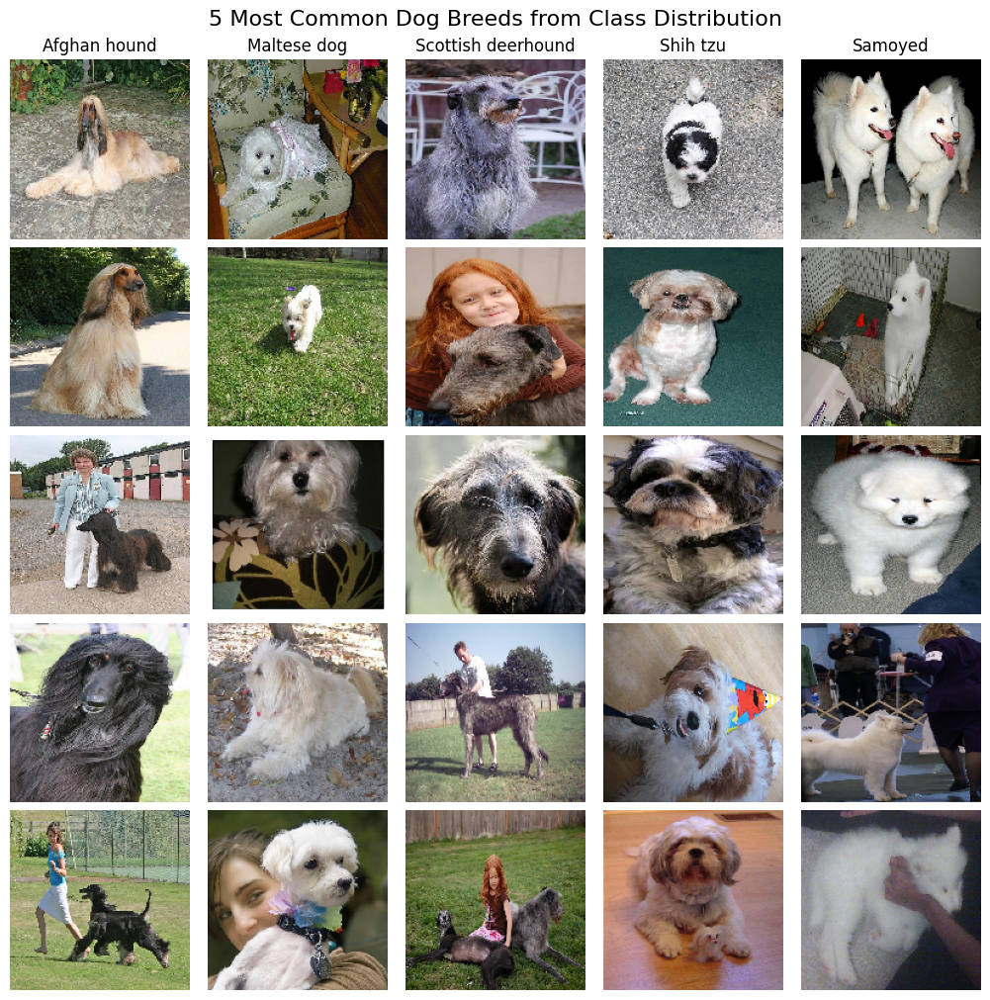

In [13]:
dims = 5
fig, axs = plt.subplots(dims,dims, figsize=(10,10), constrained_layout=True)
fig.suptitle("5 Most Common Dog Breeds from Class Distribution", fontsize=16)
count=0

# plot images of top 5 most common breeds
for x in range(dims):
    axs[0,x].set_title(categories[top_5_ind[x]])
    top_ind = np.where(y_train==top_5_ind[x])[0][:5]
    for y in range(dims):
        axs[y,x].axis("off")
        axs[y,x].imshow(np.array(X_train[top_ind[y]]).astype("uint8"))
        count+=1

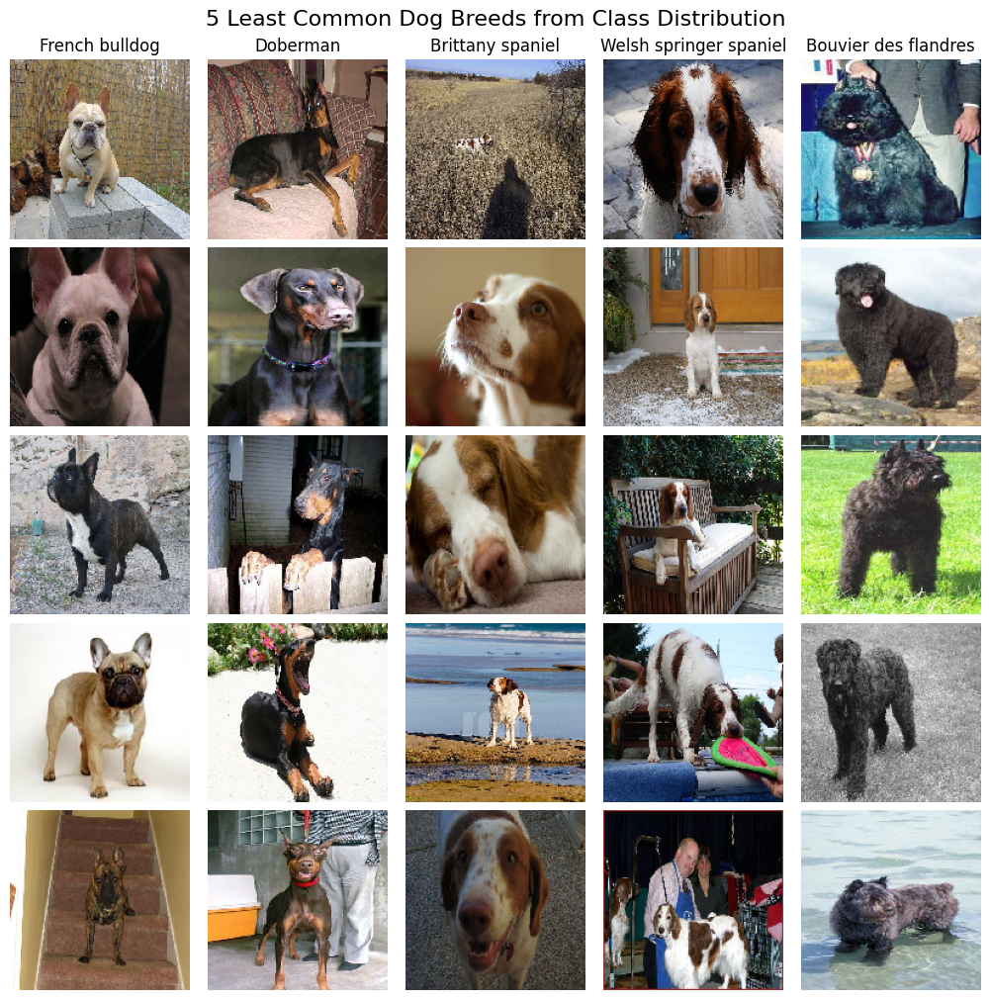

In [14]:
dims = 5
fig, axs = plt.subplots(dims,dims, figsize=(10,10), constrained_layout=True)
fig.suptitle("5 Least Common Dog Breeds from Class Distribution", fontsize=16)
count=0

# plot images of least 5 most common breeds
for x in range(dims):
    axs[0,x].set_title(categories[bottom_5_ind[x]])
    bottom_ind = np.where(y_train==bottom_5_ind[x])[0][:5]
    for y in range(dims):
        axs[y,x].axis("off")
        axs[y,x].imshow(np.array(X_train[bottom_ind[y]]).astype("uint8"))
        count+=1

In [15]:
# image augmentation 
img_augmentation_layers = [
    layers.RandomRotation(factor=0.15),
    layers.RandomTranslation(height_factor=0.1, width_factor=0.1),
    layers.RandomFlip(),
    layers.RandomContrast(factor=0.1),
]

def img_augmentation(images):
    for layer in img_augmentation_layers:
        images = layer(images)
    return images

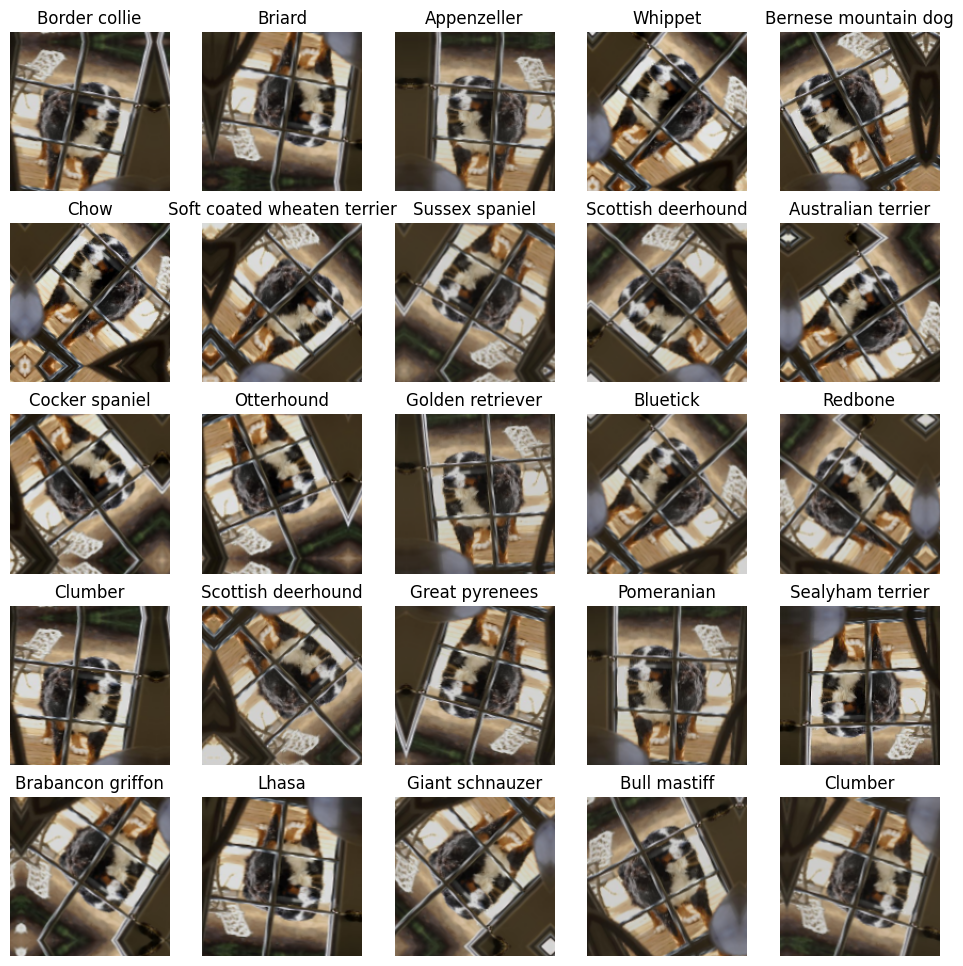

In [16]:
# images of augmented photos
dims = 5
fig, axs = plt.subplots(dims,dims, figsize=(12,12))
count=0

for x in range(dims):
    for y in range(dims):
        aug_img = np.array(img_augmentation(X_train[4]))
        axs[x,y].imshow(aug_img.astype("uint8"))
        axs[x,y].axis("off")
        axs[x,y].set_title(categories[int(y_train[count])])
        count+=1

# 4. Modeling

In [17]:
# seed for reproducibility
keras.utils.set_random_seed(42)

## 4.1 Helper functions

### Pretrained Keras Model with Transfer Learning

- **make_model** compiles a tensorflow model with pre-computed weights transfer learning
  - base_model takes any [keras application](https://keras.io/api/applications/) model as input and freezes the convolution layers and weights trained on ImageNet
  - adds a trainable pooling layer, dense layer, dropout layer and second dense layer after the base model
  - learning_rate, size_inner and droprate can be adjusted for hyperparameter tuning of these layers

In [18]:
def make_model(base_model, input_size=299, num_classes=120, learning_rate=0.01, size_inner=100, droprate=0.5):
    # use pre-trained weights for convolution layers
    base_model.trainable = False
    inputs = keras.Input(shape=(input_size, input_size, 3))
    base = base_model(inputs, training=False)

    # retrain dense layers
    vectors = keras.layers.GlobalAveragePooling2D()(base)
    inner = keras.layers.Dense(size_inner, activation='relu')(vectors) # new layer
    drop = keras.layers.Dropout(droprate)(inner) # added dropout

    # output model
    output = keras.layers.Dense(num_classes)(drop)
    model = keras.Model(inputs, output)

    # compile with optimizer and cross entropy for backprop
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
        loss=keras.losses.CategoricalCrossentropy(from_logits=True),
        metrics=[keras.metrics.CategoricalAccuracy(), 
            tf.keras.metrics.Precision(thresholds=0),
            tf.keras.metrics.Recall(thresholds=0)]
    )
    
    return model

In [19]:
def unfreeze_model(model, learning_rate, num_layers=8):
    # We unfreeze the top 20 layers while leaving BatchNorm layers frozen
    for layer in model.layers[-num_layers:]:
        if not isinstance(layer, layers.BatchNormalization):
            layer.trainable = True

    # compile with optimizer and cross entropy for backprop
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
        loss=keras.losses.CategoricalCrossentropy(from_logits=True),
        metrics=[keras.metrics.CategoricalAccuracy(), 
            tf.keras.metrics.Precision(thresholds=0),
            tf.keras.metrics.Recall(thresholds=0)]
    )

    return model

### Performance Evaluation Plots

- **plot_performance** creates four validation curve plots, one each for categorical accuracy, precision, recall and loss
  - Used for tuning the hyperparameters of each model
  - Different color lines for each hyperparameter with dashed lines for training data
  - Adds a legend below the four plots
- **plot_best** creates two validation curve plots including categorical accuracy and loss
  - Usdf for observing the final results of the tuned model to pick the lowest number of epochs with highest performance for efficient deployment
  - Red lines with dashed lines for training data

In [20]:
# thin lines and grid for all plots
plt.rcParams['lines.linewidth'] = 1
plt.rcParams['axes.grid'] = True

# inline plotting for notebook
%matplotlib inline

def plot_performance(scores, title, epochs, acc_lim=None, prec_lim=None, recall_lim=None, loss_lim=None):
    fig, axs = plt.subplots(2,2)#, constrained_layout=True)
    fig.set_size_inches(10,6.5)
    fig.suptitle(title, fontsize=14, y=0.925)

    # pretty colors for lines
    n = len(scores)
    colors = iter(plt.get_cmap('rainbow')(np.linspace(0, 1, n)))
    
    for lr, hist in scores.items():
        color = next(colors)
        axs[0,0].plot(hist['categorical_accuracy'], label=('train=%s' % lr), color=color, linestyle='dashed')
        axs[0,0].plot(hist['val_categorical_accuracy'], label=('val=%s' % lr), color=color)
        
        axs[1,0].plot(hist[list(hist.keys())[2]], label=('train=%s' % lr), color=color, linestyle='dashed')
        axs[1,0].plot(hist[list(hist.keys())[6]], label=('val=%s' % lr), color=color)
    
        axs[0,1].plot(hist[list(hist.keys())[3]], label=('train=%s' % lr), color=color, linestyle='dashed')
        axs[0,1].plot(hist[list(hist.keys())[7]], label=('val=%s' % lr), color=color)
    
        axs[1,1].plot(hist['loss'], label=('train=%s' % lr), color=color, linestyle='dashed')
        axs[1,1].plot(hist['val_loss'], label=('val=%s' % lr), color=color)
    
    axs[0,0].set_ylabel("Categorical Accuracy")
    axs[0,1].set_ylabel("Precision")    
    axs[1,0].set_ylabel("Recall")
    axs[1,1].set_ylabel("Loss")

    plt.setp(axs, xlim=[0,9], xlabel="Epoch", xticks=np.arange(epochs))

    if acc_lim:
        axs[0,0].set_ylim(acc_lim)
    if prec_lim:
        axs[0,1].set_ylim(prec_lim)
    if recall_lim:
        axs[1,0].set_ylim(recall_lim)
    if loss_lim:
        axs[1,1].set_ylim(loss_lim)

    # legend below plots
    axs[1,0].legend(loc='upper center', bbox_to_anchor=(1, -0.2),
              fancybox=True, shadow=True, ncol=len(scores))

In [21]:
def plot_best(hist, title):
    fig, axs = plt.subplots(1,2)
    fig.set_size_inches(8, 4)
    fig.suptitle(title, fontsize=14)

    axs[0].plot(hist['categorical_accuracy'], label="train", color='orange', linestyle='dashed')
    axs[0].plot(hist['val_categorical_accuracy'], label="val", color='navy')
    axs[0].set_xlabel("Epoch")
    axs[0].set_ylabel("Categorical Accuracy")
    
    axs[1].plot(hist['loss'], label="train", color='orange', linestyle='dashed')
    axs[1].plot(hist['val_loss'], label="val", color='navy')
    axs[1].legend()
    axs[1].set_xlabel("Epoch")
    axs[1].set_ylabel("Loss")

## 4.2 Model 1. Xception

[xception Application - Keras](https://keras.io/api/applications/xception/)

**Reference**
- [xception: Deep Learning with Depthwise Separable Convolutions](https://arxiv.org/abs/1610.02357)

**Base Model Architecture**

xception is "a deep convolutional neural network architecture inspired by Inception, where Inception modules have been replaced with depthwise separable convolutions". It outperforms Inception V3 on ImageNet while having the same number of parameters by making more efficient use of these model parameters. From figure 5 of the paper, the xception architecture: the data first goes through the entry flow, then through the middle flow which is repeated eight times, and finally through the exit flow. Note that all Convolution and SeparableConvolution layers are followed by batch normalization. All SeparableConvolution layers use a depth multiplier of 1 (no depth expansion).

<img src="../figures/xception-architecture.PNG" width="700">

In [22]:
batch_size=32
epochs=10
input_size=299
num_channels=3

# image generator for preprocessing
xception_gen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.xception.preprocess_input)
xception_train_ds = xception_gen.flow(X_train, y_train_tf, batch_size=batch_size)
xception_val_ds = xception_gen.flow(X_val, y_val_tf, batch_size=batch_size)

In [23]:
# base model for transfer learning
xception_base_model = tf.keras.applications.xception.Xception(
    weights='imagenet',
    include_top=False,
    input_shape=(input_size, input_size, num_channels)
)

In [24]:
# print model architecture
model = make_model(xception_base_model)
model.summary(expand_nested=True)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 299, 299, 3)]     0         
                                                                 
 xception (Functional)       (None, 10, 10, 2048)      20861480  
|¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯|
| input_1 (InputLayer)      [(None, 299, 299, 3)]     0         |
|                                                               |
| block1_conv1 (Conv2D)     (None, 149, 149, 32)      864       |
|                                                               |
| block1_conv1_bn (BatchNorma  (None, 149, 149, 32)   128       |
| lization)                                                     |
|                                                               |
| block1_conv1_act (Activatio  (None, 149, 149, 32)   0         |
| n)                                                         

### Tune Learning Rate

- 1e-05, 0.01 and 0.1 underfit (low accuracy, high loss)
- 0.0001 has highest validation accuracy and lowet loss while minimizing overfitting
- 0.001 has high accuracy and low loss as well, but overfits the training data
- we want to focus on reducing both false positives and false negatives while maintaining true positives and minimizing overfitting, so we picked learning rate = 0.0001.

In [25]:
xception_lr_scores = {}

for lr in [0.00001, 0.0001, 0.001, 0.01, 0.1]:
    print(lr)
    
    model = make_model(xception_base_model, learning_rate=lr)
    history = model.fit(xception_train_ds, epochs=epochs, validation_data=xception_val_ds)#, callbacks=[csv_logger])
    xception_lr_scores[lr] = history.history

    print()
    print()

1e-05
Epoch 1/10
412/412 [==============================] - 39s 71ms/step - loss: 4.9599 - categorical_accuracy: 0.0108 - precision_1: 0.0091 - recall_1: 0.5254 - val_loss: 4.7372 - val_categorical_accuracy: 0.0167 - val_precision_1: 0.0108 - val_recall_1: 0.6070
Epoch 2/10
412/412 [==============================] - 14s 34ms/step - loss: 4.7400 - categorical_accuracy: 0.0194 - precision_1: 0.0107 - recall_1: 0.6122 - val_loss: 4.6197 - val_categorical_accuracy: 0.0346 - val_precision_1: 0.0128 - val_recall_1: 0.7094
Epoch 3/10
412/412 [==============================] - 14s 33ms/step - loss: 4.6230 - categorical_accuracy: 0.0317 - precision_1: 0.0122 - recall_1: 0.6838 - val_loss: 4.5056 - val_categorical_accuracy: 0.0665 - val_precision_1: 0.0145 - val_recall_1: 0.7807
Epoch 4/10
412/412 [==============================] - 14s 33ms/step - loss: 4.4942 - categorical_accuracy: 0.0545 - precision_1: 0.0134 - recall_1: 0.7422 - val_loss: 4.3650 - val_categorical_accuracy: 0.1105 - val_preci

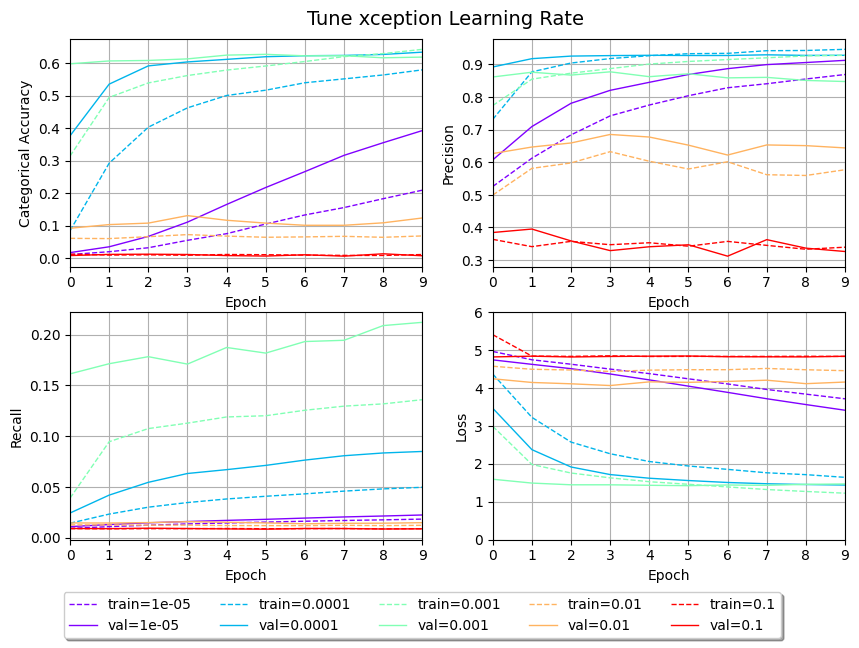

In [26]:
plot_performance(xception_lr_scores, "Tune xception Learning Rate", epochs, loss_lim=[0,6])

In [27]:
xception_learning_rate = 0.0001

### Tune inner layer

In [28]:
xception_size_scores = {}

for size in [10, 50, 100, 250, 500, 1000]:
    print(size)

    model = make_model(xception_base_model, learning_rate=xception_learning_rate, size_inner=size)
    history = model.fit(xception_train_ds, epochs=10, validation_data=xception_val_ds)
    xception_size_scores[size] = history.history

    print()
    print()

10
Epoch 1/10
412/412 [==============================] - 16s 34ms/step - loss: 4.7626 - categorical_accuracy: 0.0139 - precision_6: 0.0095 - recall_6: 0.5193 - val_loss: 4.6886 - val_categorical_accuracy: 0.0255 - val_precision_6: 0.0117 - val_recall_6: 0.6687
Epoch 2/10
412/412 [==============================] - 14s 33ms/step - loss: 4.6385 - categorical_accuracy: 0.0276 - precision_6: 0.0115 - recall_6: 0.6374 - val_loss: 4.5175 - val_categorical_accuracy: 0.0635 - val_precision_6: 0.0142 - val_recall_6: 0.7446
Epoch 3/10
412/412 [==============================] - 13s 33ms/step - loss: 4.5031 - categorical_accuracy: 0.0415 - precision_6: 0.0131 - recall_6: 0.6864 - val_loss: 4.3347 - val_categorical_accuracy: 0.0932 - val_precision_6: 0.0166 - val_recall_6: 0.7859
Epoch 4/10
412/412 [==============================] - 13s 33ms/step - loss: 4.3682 - categorical_accuracy: 0.0555 - precision_6: 0.0145 - recall_6: 0.7206 - val_loss: 4.1820 - val_categorical_accuracy: 0.1266 - val_precisio

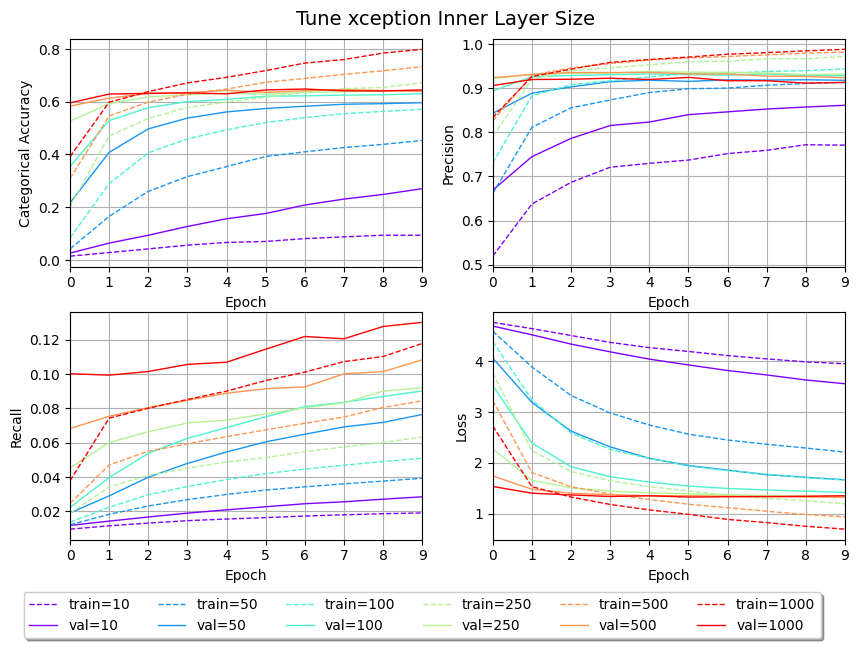

In [29]:
plot_performance(xception_size_scores, "Tune xception Inner Layer Size", epochs)

sizes 500 and 1000 have the highest performance metrics but are also subject to significant overfitting due to the increased complexity of the model. Sizes 250 and 100 fall below, while still maintaining decent performance, however 250 has slightly better performance than 100, although it is subject to a bit more overfitting. We decided to move forward with 250 as our inner layer size because this size also has the lowest loss and highest precision while minimizing overfitting (distance between train and validation curves).

In [30]:
xception_size_inner = 100

### Tune dropout rate

In [31]:
drop_scores = {}

for drop in [0.25, 0.4, 0.5, 0.6, 0.75]:
    print(drop)

    model = make_model(xception_base_model, learning_rate=xception_learning_rate, size_inner=xception_size_inner, droprate=drop)
    history = model.fit(xception_train_ds, epochs=10, validation_data=xception_val_ds)
    drop_scores[drop] = history.history

    print()
    print()

0.25
Epoch 1/10
412/412 [==============================] - 16s 34ms/step - loss: 3.9688 - categorical_accuracy: 0.1779 - precision_12: 0.0159 - recall_12: 0.8055 - val_loss: 2.7545 - val_categorical_accuracy: 0.4595 - val_precision_12: 0.0285 - val_recall_12: 0.9165
Epoch 2/10
412/412 [==============================] - 13s 32ms/step - loss: 2.4152 - categorical_accuracy: 0.4534 - precision_12: 0.0290 - recall_12: 0.9255 - val_loss: 1.8558 - val_categorical_accuracy: 0.5736 - val_precision_12: 0.0424 - val_recall_12: 0.9326
Epoch 3/10
412/412 [==============================] - 13s 33ms/step - loss: 1.9343 - categorical_accuracy: 0.5329 - precision_12: 0.0350 - recall_12: 0.9377 - val_loss: 1.6235 - val_categorical_accuracy: 0.6040 - val_precision_12: 0.0476 - val_recall_12: 0.9390
Epoch 4/10
412/412 [==============================] - 13s 33ms/step - loss: 1.7113 - categorical_accuracy: 0.5679 - precision_12: 0.0384 - recall_12: 0.9490 - val_loss: 1.5238 - val_categorical_accuracy: 0.615

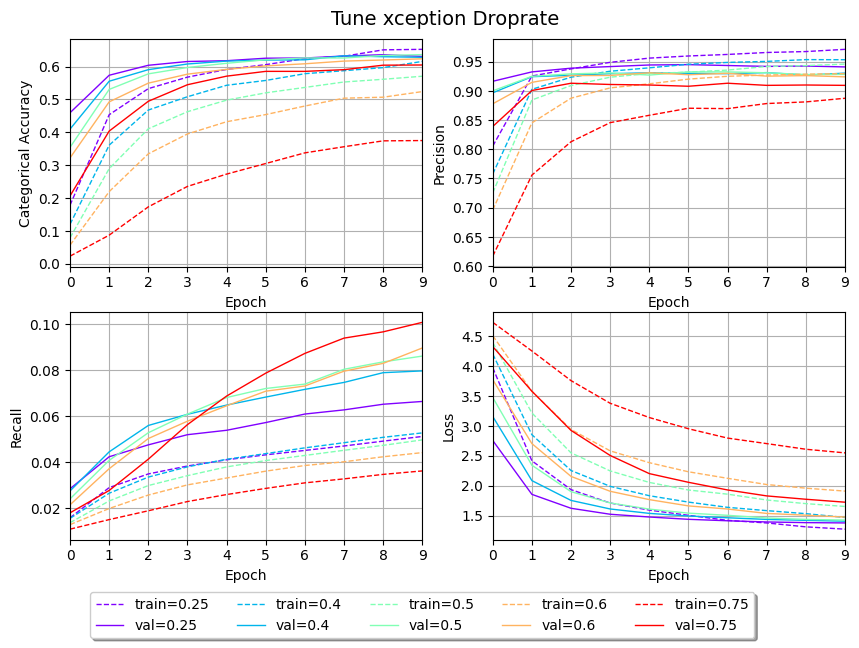

In [32]:
plot_performance(drop_scores, "Tune xception Droprate", 10)

In [33]:
xception_droprate = 0.4

### Save best model

In [34]:
# image generator for epoch tuning and final learning curve analysis
xception_train_ds_big = xception_gen.flow(X_train_big, y_train_big_tf, batch_size=batch_size)
xception_val_ds_big = xception_gen.flow(X_val_big, y_val_big_tf, batch_size=batch_size)

In [35]:
# create model with begininng layers trainable
model = make_model(xception_base_model, learning_rate=xception_learning_rate, size_inner=xception_size_inner, droprate=xception_droprate)
model = unfreeze_model(model, learning_rate=xception_learning_rate, num_layers=4)

# fit model to training data
xception_train_history = model.fit(
    xception_train_ds_big,
    epochs=50,
    validation_data=xception_val_ds_big
)

Epoch 1/50
412/412 [==============================] - 55s 129ms/step - loss: 4.0739 - categorical_accuracy: 0.2328 - precision_18: 0.0197 - recall_18: 0.8462 - val_loss: 3.1086 - val_categorical_accuracy: 0.6605 - val_precision_18: 0.0470 - val_recall_18: 0.9778
Epoch 2/50
412/412 [==============================] - 49s 120ms/step - loss: 2.4611 - categorical_accuracy: 0.6034 - precision_18: 0.0424 - recall_18: 0.9692 - val_loss: 1.5988 - val_categorical_accuracy: 0.8266 - val_precision_18: 0.0965 - val_recall_18: 0.9885
Epoch 3/50
412/412 [==============================] - 50s 120ms/step - loss: 1.5125 - categorical_accuracy: 0.7260 - precision_18: 0.0602 - recall_18: 0.9812 - val_loss: 0.9340 - val_categorical_accuracy: 0.8691 - val_precision_18: 0.1187 - val_recall_18: 0.9903
Epoch 4/50
412/412 [==============================] - 49s 120ms/step - loss: 1.1006 - categorical_accuracy: 0.7754 - precision_18: 0.0705 - recall_18: 0.9852 - val_loss: 0.6744 - val_categorical_accuracy: 0.8779

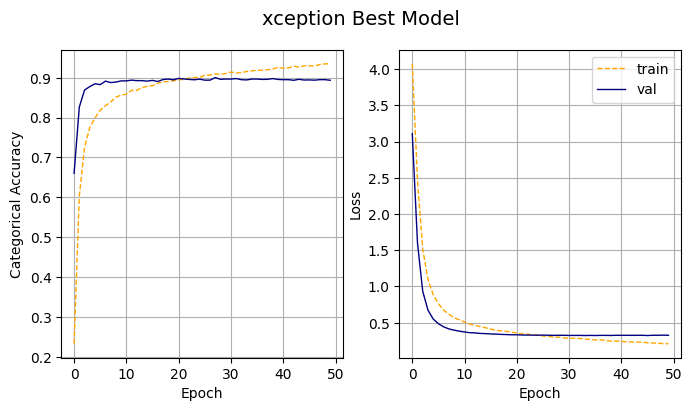

In [36]:
# final learning curves
plot_best(xception_train_history.history, title="xception Best Model")

In [37]:
# performance metrics for model comparison
xception_params = model.count_params()
xception_epochs = np.argmax(xception_train_history.history['val_categorical_accuracy'])
xception_loss_epochs = np.argmin(xception_train_history.history['val_loss'])
xception_train_accuracy = xception_train_history.history['categorical_accuracy'][xception_epochs]
xception_train_loss = xception_train_history.history['loss'][xception_epochs]
xception_val_accuracy = xception_train_history.history['val_categorical_accuracy'][xception_epochs]
xception_val_loss = xception_train_history.history['val_loss'][xception_epochs]

**Retrain model at tuned number of epochs to save**

In [44]:
# create new model
model = make_model(xception_base_model, learning_rate=xception_learning_rate, size_inner=xception_size_inner, droprate=xception_droprate)
model = unfreeze_model(model, learning_rate=xception_learning_rate, num_layers=4)

# fit model to training data with tuned num of epochs to prevent overfitting
start = time()
model.fit(
    xception_train_ds_big,
    epochs=xception_epochs
)
xception_train_time = time() - start
xception_train_time = xception_train_time/epochs

Epoch 1/27
412/412 [==============================] - 42s 96ms/step - loss: 4.0835 - categorical_accuracy: 0.2528 - precision_20: 0.0203 - recall_20: 0.8248
Epoch 2/27
412/412 [==============================] - 40s 97ms/step - loss: 2.4522 - categorical_accuracy: 0.6121 - precision_20: 0.0480 - recall_20: 0.9598
Epoch 3/27
412/412 [==============================] - 40s 97ms/step - loss: 1.5076 - categorical_accuracy: 0.7238 - precision_20: 0.0696 - recall_20: 0.9782
Epoch 4/27
412/412 [==============================] - 40s 97ms/step - loss: 1.0814 - categorical_accuracy: 0.7729 - precision_20: 0.0820 - recall_20: 0.9841
Epoch 5/27
412/412 [==============================] - 40s 98ms/step - loss: 0.8747 - categorical_accuracy: 0.8049 - precision_20: 0.0899 - recall_20: 0.9852
Epoch 6/27
412/412 [==============================] - 40s 97ms/step - loss: 0.7476 - categorical_accuracy: 0.8195 - precision_20: 0.0949 - recall_20: 0.9874
Epoch 7/27
412/412 [==============================] - 40s 

In [45]:
# save model
path = os.path.join('..', 'models', 'xception_model.keras')
model.save(path)

# model size in mb
xception_size = os.stat(path).st_size / (1024 * 1024)

### Final prediction

In [46]:
# load model
path = os.path.join('..', 'models', 'xception_model.keras')
xception_model = keras.models.load_model(path)

In [47]:
# image generator with held-out training data for test data prediction
xception_test_ds_big = xception_gen.flow(X_test_big, y_test_big_tf, batch_size=batch_size,shuffle=False)

# compute testing statistics
start = time()
xception_test_predict = xception_model.predict(xception_test_ds_big)
xception_predict_time = time() - start

xception_test_predict = np.argmax(xception_test_predict, axis=1)
xception_accuracy, xception_precision, xception_recall, xception_f1 = accuracy_score(xception_test_predict, y_test_big), precision_score(xception_test_predict, y_test_big, average='macro'), recall_score(xception_test_predict, y_test_big, average='macro'), f1_score(xception_test_predict, y_test_big, average='macro')

129/129 [==============================] - 13s 94ms/step


In [48]:
new_line = "\n"
print(
    f"--- Xception Final Info and Statistics ---{new_line}"
    f"-- Tuned parameters --{new_line}"
    f"learning rate: {xception_learning_rate}{new_line}"
    f"inner layer size: {xception_size_inner}{new_line}"
    f"dropout rate: {xception_droprate}{new_line}"
    f"epochs: {xception_epochs}{new_line}{new_line}"

    f"-- Model info --{new_line}"
    f"model size: {xception_size:,.3f}{new_line}"
    f"number of parameters: {xception_params}{new_line}{new_line}"

    f"-- Model statistics --{new_line}"
    f"avg train time: {xception_train_time:,.3f}{new_line}"
    f"predict time: {xception_predict_time:,.3f}{new_line}{new_line}"

    f"training accuracy: {xception_train_accuracy:,.3f}{new_line}"
    f"training loss: {xception_train_loss:,.3f}{new_line}{new_line}"
 
    f"validation accuracy: {xception_val_accuracy:,.3f}{new_line}"
    f"validation loss: {xception_val_loss:,.3f}{new_line}{new_line}"
 
    f"test accuracy: {xception_accuracy:,.3f}{new_line}"
    f"test precision: {xception_precision:,.3f}{new_line}"
    f"test recall: {xception_recall:,.3f}{new_line}"
    f"test f1: {xception_f1:,.3f}{new_line}"
)

--- Xception Final Info and Statistics ---
-- Tuned parameters --
learning rate: 0.0001
inner layer size: 100
dropout rate: 0.4
epochs: 27

-- Model info --
model size: 82.333
number of parameters: 21078500

-- Model statistics --
avg train time: 107.193
predict time: 12.640

training accuracy: 0.910
training loss: 0.301

validation accuracy: 0.900
validation loss: 0.325

test accuracy: 0.905
test precision: 0.904
test recall: 0.904
test f1: 0.902



In [42]:
new_line = "\n"
print(
    f"xception_learning_rate = {xception_learning_rate}{new_line}"
    f"xception_size_inner = {xception_size_inner}{new_line}"
    f"xception_droprate = {xception_droprate}{new_line}"
    f"xception_epochs = {xception_epochs}{new_line}{new_line}"

    f"xception_size = {xception_size}{new_line}"
    f"xception_params = {xception_params}{new_line}{new_line}"

    f"xception_train_time = {xception_train_time}{new_line}"
    f"xception_predict_time = {xception_predict_time}{new_line}{new_line}"

    f"xception_train_accuracy = {xception_train_accuracy}{new_line}"
    f"xception_train_loss = {xception_train_loss}{new_line}{new_line}"

    f"xception_val_accuracy = {xception_val_accuracy}{new_line}"
    f"xception_val_loss = {xception_val_loss}{new_line}{new_line}"
 
    f"xception_accuracy = {xception_accuracy}{new_line}"
    f"xception_precision = {xception_precision}{new_line}"
    f"xception_recall = {xception_recall}{new_line}"
    f"xception_f1 = {xception_f1}{new_line}"
)

xception_learning_rate = 0.0001
xception_size_inner = 100
xception_droprate = 0.4
xception_epochs = 19

xception_size = 82.33295440673828
xception_params = 21078500

xception_train_time = 74.20129995346069
xception_predict_time = 18.585499048233032

xception_train_accuracy = 0.8912003636360168
xception_train_loss = 0.3666827082633972

xception_val_accuracy = 0.8964470028877258
xception_val_loss = 0.3333843946456909

xception_accuracy = 0.902818270165209
xception_precision = 0.9007486622037487
xception_recall = 0.9030658012215812
xception_f1 = 0.8991388762879853



## 4.3 Model 2. InceptionResNetV2

[InceptionResNetV2 Application - Keras](https://keras.io/api/applications/inceptionresnetv2/)

**Reference**
- [Inception-v4, Inception-ResNet and the Impact of Residual Connections on Learning](https://arxiv.org/abs/1602.07261) (AAAI 2017)

**Base Model Architecture**

Figures 3-9 from [Inception-v4, Inception-ResNet and the Impact of Residual Connections on Learning](https://arxiv.org/abs/1602.07261) (AAAI 2017). Figure 3 shows the architecture divided into blocks. The full architecture next to it is taken from figures 4-9. Note that each inception block is repeated the number of times as specified in figure 3, and also next to the Filter concat block. For Reduction-B, the k, l, m, n numbers represent filter bank sizes which can be looked up in Table 1.

<img src="../figures/resnetv2-architecture.PNG" width="1000">

In [49]:
# image generator for preprocessing
inception_gen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.inception_resnet_v2.preprocess_input)
inception_train_ds = inception_gen.flow(X_train, y_train_tf, batch_size=batch_size)
inception_val_ds = inception_gen.flow(X_val, y_val_tf, batch_size=batch_size)

In [50]:
inception_base_model = tf.keras.applications.inception_resnet_v2.InceptionResNetV2(
        weights='imagenet',
        include_top=False,
        input_shape=(299, 299, 3)
    )

epochs = 20

In [51]:
model = make_model(inception_base_model)
model.summary(expand_nested=True)

Model: "model_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_22 (InputLayer)       [(None, 299, 299, 3)]     0         
                                                                 
 inception_resnet_v2 (Functi  (None, 8, 8, 1536)       54336736  
 onal)                                                           
|¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯|
| input_21 (InputLayer)     [(None, 299, 299, 3)]     0         |
|                                                               |
| conv2d_4 (Conv2D)         (None, 149, 149, 32)      864       |
|                                                               |
| batch_normalization_4 (Batc  (None, 149, 149, 32)   96        |
| hNormalization)                                               |
|                                                               |
| activation (Activation)   (None, 149, 149, 32)      0   

### Tune learning rate

In [52]:
inception_lr_scores = {}

for lr in [0.00001, 0.0001, 0.001, 0.01, 0.1]:
    print(lr)

    model = make_model(inception_base_model, learning_rate=lr)
    history = model.fit(inception_train_ds, epochs=epochs, validation_data=inception_val_ds)
    inception_lr_scores[lr] = history.history

    print()
    print()

1e-05
Epoch 1/20
412/412 [==============================] - 41s 83ms/step - loss: 5.7435 - categorical_accuracy: 0.0081 - precision_22: 0.0090 - recall_22: 0.5460 - val_loss: 4.7552 - val_categorical_accuracy: 0.0173 - val_precision_22: 0.0106 - val_recall_22: 0.6496
Epoch 2/20
412/412 [==============================] - 31s 76ms/step - loss: 4.7723 - categorical_accuracy: 0.0197 - precision_22: 0.0107 - recall_22: 0.6529 - val_loss: 4.5301 - val_categorical_accuracy: 0.0513 - val_precision_22: 0.0123 - val_recall_22: 0.7531
Epoch 3/20
412/412 [==============================] - 32s 77ms/step - loss: 4.5684 - categorical_accuracy: 0.0360 - precision_22: 0.0119 - recall_22: 0.7163 - val_loss: 4.3646 - val_categorical_accuracy: 0.1084 - val_precision_22: 0.0134 - val_recall_22: 0.8029
Epoch 4/20
412/412 [==============================] - 32s 77ms/step - loss: 4.4169 - categorical_accuracy: 0.0599 - precision_22: 0.0128 - recall_22: 0.7641 - val_loss: 4.1750 - val_categorical_accuracy: 0.16

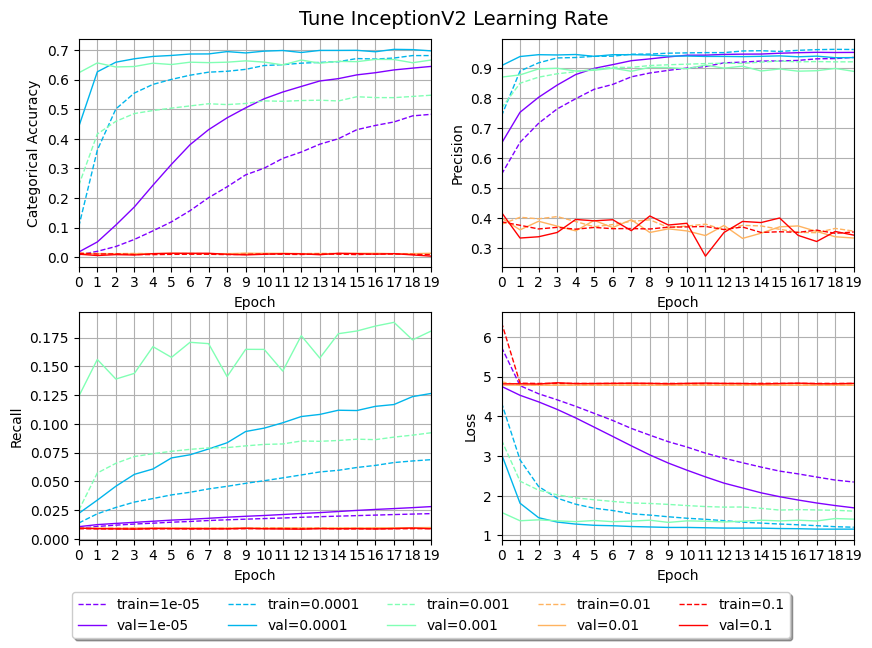

In [53]:
plot_performance(inception_lr_scores, "Tune InceptionV2 Learning Rate", epochs)

In [54]:
inception_learning_rate = 0.0001

### Tune inner layer

In [55]:
inception_size_scores = {}

for size in [10, 50, 100, 250, 500, 1000]:
    print(size)

    model = make_model(inception_base_model, learning_rate=inception_learning_rate, size_inner=size)
    history = model.fit(inception_train_ds, epochs=epochs, validation_data=inception_val_ds)
    inception_size_scores[size] = history.history

    print()
    print()

10
Epoch 1/20
412/412 [==============================] - 41s 83ms/step - loss: 4.7219 - categorical_accuracy: 0.0163 - precision_27: 0.0107 - recall_27: 0.5783 - val_loss: 4.5191 - val_categorical_accuracy: 0.0468 - val_precision_27: 0.0142 - val_recall_27: 0.7640
Epoch 2/20
412/412 [==============================] - 32s 77ms/step - loss: 4.4552 - categorical_accuracy: 0.0410 - precision_27: 0.0134 - recall_27: 0.6949 - val_loss: 4.1767 - val_categorical_accuracy: 0.1324 - val_precision_27: 0.0176 - val_recall_27: 0.8214
Epoch 3/20
412/412 [==============================] - 32s 77ms/step - loss: 4.2399 - categorical_accuracy: 0.0611 - precision_27: 0.0153 - recall_27: 0.7463 - val_loss: 3.8837 - val_categorical_accuracy: 0.1965 - val_precision_27: 0.0205 - val_recall_27: 0.8476
Epoch 4/20
412/412 [==============================] - 32s 77ms/step - loss: 4.0937 - categorical_accuracy: 0.0763 - precision_27: 0.0166 - recall_27: 0.7672 - val_loss: 3.6857 - val_categorical_accuracy: 0.2375 

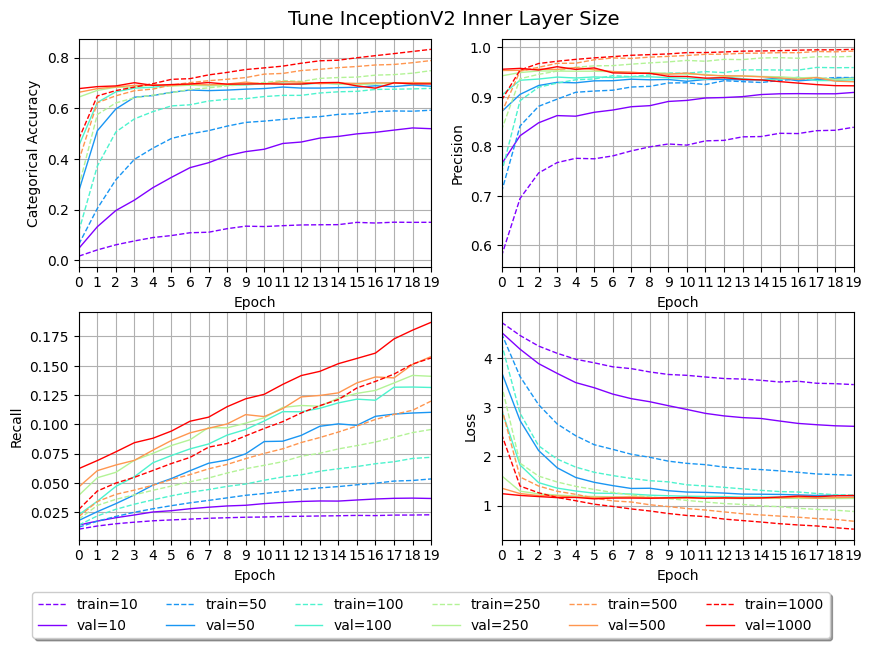

In [56]:
plot_performance(inception_size_scores, "Tune InceptionV2 Inner Layer Size", epochs)

In [57]:
inception_size_inner = 100

### Tune dropout rate

In [58]:
inception_drop_scores = {}

for drop in [0.25, 0.4, 0.5, 0.6, 0.75]:
    print(drop)

    model = make_model(base_model=inception_base_model,learning_rate=inception_learning_rate, size_inner=inception_size_inner, droprate=drop)
    history = model.fit(inception_train_ds, epochs=10, validation_data=inception_val_ds)
    inception_drop_scores[drop] = history.history

    print()
    print()

0.25
Epoch 1/10
412/412 [==============================] - 41s 83ms/step - loss: 3.6017 - categorical_accuracy: 0.2537 - precision_33: 0.0164 - recall_33: 0.8358 - val_loss: 1.9531 - val_categorical_accuracy: 0.6049 - val_precision_33: 0.0265 - val_recall_33: 0.9399
Epoch 2/10
412/412 [==============================] - 31s 76ms/step - loss: 1.8863 - categorical_accuracy: 0.5713 - precision_33: 0.0276 - recall_33: 0.9405 - val_loss: 1.3976 - val_categorical_accuracy: 0.6550 - val_precision_33: 0.0391 - val_recall_33: 0.9462
Epoch 3/10
412/412 [==============================] - 31s 76ms/step - loss: 1.5588 - categorical_accuracy: 0.6247 - precision_33: 0.0331 - recall_33: 0.9515 - val_loss: 1.2890 - val_categorical_accuracy: 0.6699 - val_precision_33: 0.0399 - val_recall_33: 0.9551
Epoch 4/10
412/412 [==============================] - 31s 76ms/step - loss: 1.4160 - categorical_accuracy: 0.6529 - precision_33: 0.0364 - recall_33: 0.9587 - val_loss: 1.2515 - val_categorical_accuracy: 0.680

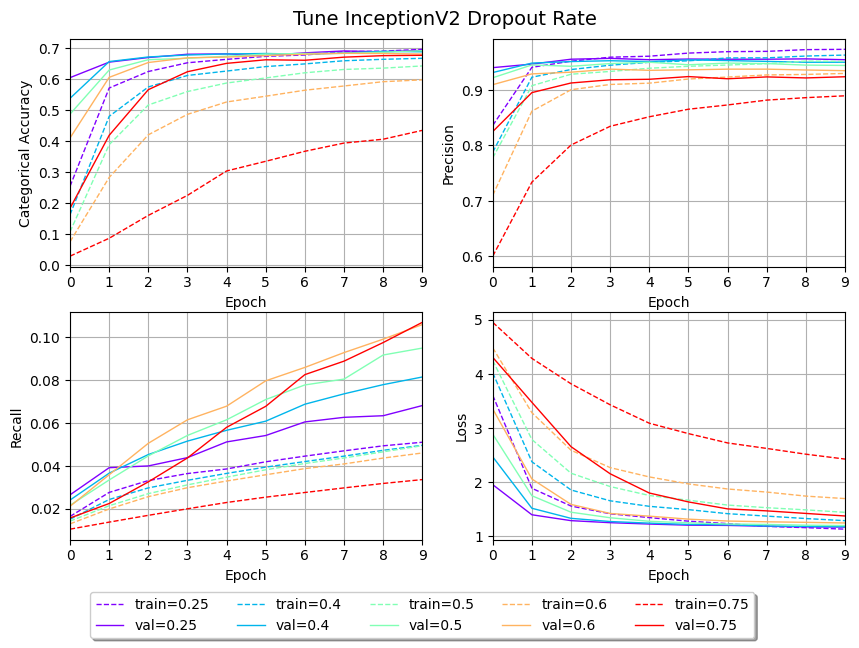

In [59]:
plot_performance(inception_drop_scores, "Tune InceptionV2 Dropout Rate", 10)

In [60]:
inception_droprate = 0.4

### Save best model

In [61]:
# image generator for final testing
inception_train_ds_big = inception_gen.flow(X_train_big, y_train_big_tf, batch_size=batch_size)
inception_val_ds_big = inception_gen.flow(X_val_big, y_val_big_tf, batch_size=batch_size)

In [62]:
# create model with begininng layers trainable
model = make_model(inception_base_model, learning_rate=inception_learning_rate, size_inner=inception_size_inner, droprate=inception_droprate)
model = unfreeze_model(model, learning_rate=inception_learning_rate, num_layers=4)

# fit model to training data
inception_train_history = model.fit(
    inception_train_ds_big,
    epochs=50,
    validation_data=inception_val_ds_big
)

Epoch 1/50
412/412 [==============================] - 96s 216ms/step - loss: 3.7715 - categorical_accuracy: 0.3328 - precision_39: 0.0201 - recall_39: 0.8789 - val_loss: 2.3990 - val_categorical_accuracy: 0.8266 - val_precision_39: 0.0623 - val_recall_39: 0.9860
Epoch 2/50
412/412 [==============================] - 86s 209ms/step - loss: 1.8064 - categorical_accuracy: 0.7581 - precision_39: 0.0481 - recall_39: 0.9800 - val_loss: 0.9151 - val_categorical_accuracy: 0.8989 - val_precision_39: 0.1374 - val_recall_39: 0.9900
Epoch 3/50
412/412 [==============================] - 86s 210ms/step - loss: 0.9825 - categorical_accuracy: 0.8403 - precision_39: 0.0676 - recall_39: 0.9872 - val_loss: 0.4997 - val_categorical_accuracy: 0.9113 - val_precision_39: 0.1637 - val_recall_39: 0.9924
Epoch 4/50
412/412 [==============================] - 86s 210ms/step - loss: 0.7049 - categorical_accuracy: 0.8626 - precision_39: 0.0779 - recall_39: 0.9897 - val_loss: 0.3795 - val_categorical_accuracy: 0.9116

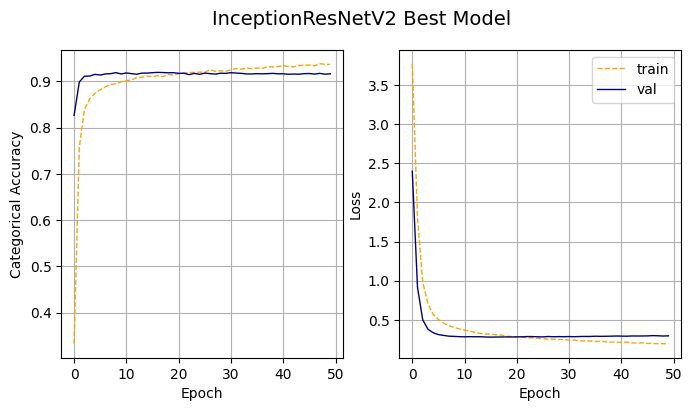

In [63]:
plot_best(inception_train_history.history, title="InceptionResNetV2 Best Model")

In [64]:
# performance metrics for model comparison
inception_params = model.count_params()
inception_epochs = np.argmax(inception_train_history.history['val_categorical_accuracy'])
inception_train_accuracy = inception_train_history.history['categorical_accuracy'][inception_epochs]
inception_train_loss = inception_train_history.history['loss'][inception_epochs]
inception_val_accuracy = inception_train_history.history['val_categorical_accuracy'][inception_epochs]
inception_val_loss = inception_train_history.history['val_loss'][inception_epochs]

**Retrain model at tuned number of epochs to save**

In [65]:
# create new model
model = make_model(inception_base_model, learning_rate=inception_learning_rate, size_inner=inception_size_inner, droprate=inception_droprate)
model = unfreeze_model(model, learning_rate=inception_learning_rate, num_layers=4)

# fit model to training data with tuned num of epochs to prevent overfitting
start = time()
model.fit(
    inception_train_ds_big,
    epochs=inception_epochs
)
inception_train_time = time() - start
inception_train_time = inception_train_time/epochs

Epoch 1/16
412/412 [==============================] - 76s 168ms/step - loss: 3.7665 - categorical_accuracy: 0.3284 - precision_41: 0.0205 - recall_41: 0.8837
Epoch 2/16
412/412 [==============================] - 69s 168ms/step - loss: 1.8048 - categorical_accuracy: 0.7577 - precision_41: 0.0502 - recall_41: 0.9775
Epoch 3/16
412/412 [==============================] - 69s 168ms/step - loss: 0.9855 - categorical_accuracy: 0.8377 - precision_41: 0.0724 - recall_41: 0.9848
Epoch 4/16
412/412 [==============================] - 69s 168ms/step - loss: 0.6991 - categorical_accuracy: 0.8617 - precision_41: 0.0827 - recall_41: 0.9882
Epoch 5/16
412/412 [==============================] - 69s 169ms/step - loss: 0.5739 - categorical_accuracy: 0.8753 - precision_41: 0.0890 - recall_41: 0.9888
Epoch 6/16
412/412 [==============================] - 69s 168ms/step - loss: 0.5005 - categorical_accuracy: 0.8853 - precision_41: 0.0952 - recall_41: 0.9904
Epoch 7/16
412/412 [==============================] 

In [66]:
# save model
path = os.path.join('..', 'models', 'inception_model.keras')
model.save(path)

# model size in mb
inception_size = os.stat(path).st_size / (1024 * 1024)

### Final prediction

In [67]:
# load model
path = os.path.join('..', 'models', 'inception_model.keras')
inception_model = keras.models.load_model(path)

In [68]:
# image generator with held-out training data for test data prediction
inception_test_ds_big = inception_gen.flow(X_test_big, y_test_big_tf, batch_size=batch_size,shuffle=False)

# compute testing statistics
start = time()
inception_test_predict = inception_model.predict(inception_test_ds_big)
inception_predict_time = time() - start

inception_test_predict = np.argmax(inception_test_predict, axis=1)
inception_accuracy, inception_precision, inception_recall, inception_f1 = accuracy_score(inception_test_predict, y_test_big), precision_score(inception_test_predict, y_test_big, average='macro'), recall_score(inception_test_predict, y_test_big, average='macro'), f1_score(inception_test_predict, y_test_big, average='macro')

129/129 [==============================] - 24s 166ms/step


In [69]:
# new epochs
new_line = "\n"
print(
    f"--- Inception Final Info and Statistics ---{new_line}"
    f"-- Tuned parameters --{new_line}"
    f"learning rate: {inception_learning_rate}{new_line}"
    f"inner layer size: {inception_size_inner}{new_line}"
    f"dropout rate: {inception_droprate}{new_line}"
    f"epochs: {inception_epochs+1}{new_line}{new_line}"

    f"-- Model info --{new_line}"
    f"model size: {inception_size:,.3f}{new_line}"
    f"number of parameters: {inception_params}{new_line}{new_line}"

    f"-- Model statistics --{new_line}"
    f"avg train time: {inception_train_time:,.3f}{new_line}"
    f"predict time: {inception_predict_time:,.3f}{new_line}{new_line}"

    f"training accuracy: {inception_train_accuracy:,.3f}{new_line}"
    f"training loss: {inception_train_loss:,.3f}{new_line}{new_line}"
 
    f"validation accuracy: {inception_val_accuracy:,.3f}{new_line}"
    f"validation loss: {inception_val_loss:,.3f}{new_line}{new_line}"
 
    f"test accuracy: {inception_accuracy:,.3f}{new_line}"
    f"test precision: {inception_precision:,.3f}{new_line}"
    f"test recall: {inception_recall:,.3f}{new_line}"
    f"test f1: {inception_f1:,.3f}{new_line}"
)

--- Inception Final Info and Statistics ---
-- Tuned parameters --
learning rate: 0.0001
inner layer size: 100
dropout rate: 0.4
epochs: 17

-- Model info --
model size: 210.373
number of parameters: 54502556

-- Model statistics --
avg train time: 55.918
predict time: 23.855

training accuracy: 0.912
training loss: 0.308

validation accuracy: 0.920
validation loss: 0.280

test accuracy: 0.920
test precision: 0.918
test recall: 0.921
test f1: 0.918



In [63]:
# old
new_line = "\n"
print(
    f"--- Inception Final Info and Statistics ---{new_line}"
    f"-- Tuned parameters --{new_line}"
    f"learning rate: {inception_learning_rate}{new_line}"
    f"inner layer size: {inception_size_inner}{new_line}"
    f"dropout rate: {inception_droprate}{new_line}"
    f"epochs: {inception_epochs+1}{new_line}{new_line}"

    f"-- Model info --{new_line}"
    f"model size: {inception_size:,.3f}{new_line}"
    f"number of parameters: {inception_params}{new_line}{new_line}"

    f"-- Model statistics --{new_line}"
    f"avg train time: {inception_train_time:,.3f}{new_line}"
    f"predict time: {inception_predict_time:,.3f}{new_line}{new_line}"

    f"training accuracy: {inception_train_accuracy:,.3f}{new_line}"
    f"training loss: {inception_train_loss:,.3f}{new_line}{new_line}"
 
    f"validation accuracy: {inception_val_accuracy:,.3f}{new_line}"
    f"validation loss: {inception_val_loss:,.3f}{new_line}{new_line}"
 
    f"test accuracy: {inception_accuracy:,.3f}{new_line}"
    f"test precision: {inception_precision:,.3f}{new_line}"
    f"test recall: {inception_recall:,.3f}{new_line}"
    f"test f1: {inception_f1:,.3f}{new_line}"
)

--- Inception Final Info and Statistics ---
-- Tuned parameters --
learning rate: 0.0001
inner layer size: 100
dropout rate: 0.4
epochs: 16

-- Model info --
model size: 210.373
number of parameters: 54502556

-- Model statistics --
avg train time: 52.818
predict time: 25.725

training accuracy: 0.909
training loss: 0.319

validation accuracy: 0.920
validation loss: 0.280

test accuracy: 0.918
test precision: 0.915
test recall: 0.918
test f1: 0.914



In [64]:
new_line = "\n"
print(
    f"inception_learning_rate = {inception_learning_rate}{new_line}"
    f"inception_size_inner = {inception_size_inner}{new_line}"
    f"inception_droprate = {inception_droprate}{new_line}"
    f"inception_epochs = {inception_epochs}{new_line}{new_line}"

    f"inception_size = {inception_size}{new_line}"
    f"inception_params = {inception_params}{new_line}{new_line}"

    f"inception_train_time = {inception_train_time}{new_line}"
    f"inception_predict_time = {inception_predict_time}{new_line}{new_line}"

    f"inception_train_accuracy = {inception_train_accuracy}{new_line}"
    f"inception_train_loss = {inception_train_loss}{new_line}{new_line}"

    f"inception_val_accuracy = {inception_val_accuracy}{new_line}"
    f"inception_val_loss = {inception_val_loss}{new_line}{new_line}"
 
    f"inception_accuracy = {inception_accuracy}{new_line}"
    f"inception_precision = {inception_precision}{new_line}"
    f"inception_recall = {inception_recall}{new_line}"
    f"inception_f1 = {inception_f1}{new_line}"
)

inception_learning_rate = 0.0001
inception_size_inner = 100
inception_droprate = 0.4
inception_epochs = 15

inception_size = 210.3733901977539
inception_params = 54502556

inception_train_time = 52.81782500743866
inception_predict_time = 25.724998474121094

inception_train_accuracy = 0.9091185331344604
inception_train_loss = 0.31948134303092957

inception_val_accuracy = 0.9195262789726257
inception_val_loss = 0.27976125478744507

inception_accuracy = 0.9176384839650146
inception_precision = 0.9150861726949152
inception_recall = 0.9179121601616644
inception_f1 = 0.9144662707080488



## 4.4 Model 3. EfficientNetB3V2

[EfficientNetB3 Application - Keras](https://keras.io/api/applications/efficientnet/#efficientnetb3-function)

[Efficientnet Fine Tuning - Keras](https://keras.io/examples/vision/image_classification_efficientnet_fine_tuning/)

**Reference**
- [EfficientNet: Rethinking Model Scaling for Convolutional Neural Networks](https://arxiv.org/abs/1905.11946) (ICML 2019)

**Base Model Architecture**

The EfficientNet baseline architecture leverages a multi-objective neural architecture search that optimizes both accuracy and FLOPS. EfficientNetB0 is shown in Table 1 below from the paper, using MBConv layers from ([Sandler et al., 2018](https://arxiv.org/abs/1801.04381); [Tan et al., 2019](https://arxiv.org/abs/1807.11626)). EfficientNetB3 is a scaled-up version, using uniform dimension scaling as shown in (e) from the figure 2 below.

<img src="../figures/efficientnetb3-table.PNG" width="350">
<img src="../figures/efficientnetb3-scaling.PNG" width="700">

In [70]:
effnetB3_base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B3(
        weights='imagenet',
        include_top=False,
        input_shape=(299, 299, 3)
    )
epochs=10
batch_size=32

In [71]:
# image generator for preprocessing
effnetB3_gen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.efficientnet_v2.preprocess_input)
effnetB3_train_ds = effnetB3_gen.flow(X_train, y_train_tf, batch_size=batch_size)
effnetB3_val_ds = effnetB3_gen.flow(X_val, y_val_tf, batch_size=batch_size)

In [72]:
model = make_model(effnetB3_base_model)
model.summary(expand_nested=True)

Model: "model_38"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_42 (InputLayer)       [(None, 299, 299, 3)]     0         
                                                                 
 efficientnetv2-b3 (Function  (None, 10, 10, 1536)     12930622  
 al)                                                             
|¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯|
| input_41 (InputLayer)     [(None, 299, 299, 3)]     0         |
|                                                               |
| rescaling (Rescaling)     (None, 299, 299, 3)       0         |
|                                                               |
| normalization (Normalizatio  (None, 299, 299, 3)    0         |
| n)                                                            |
|                                                               |
| stem_conv (Conv2D)        (None, 150, 150, 40)      1080

### Tune learning rate

In [73]:
effnetB3_lr_scores = {}

for lr in [0.00001, 0.0001, 0.001, 0.01, 0.1]:
    print(lr)

    model = make_model(effnetB3_base_model, input_size=299, learning_rate=lr)
    history = model.fit(effnetB3_train_ds, epochs=epochs, validation_data=effnetB3_val_ds)
    effnetB3_lr_scores[lr] = history.history

    print()
    print()

1e-05
Epoch 1/10
412/412 [==============================] - 28s 53ms/step - loss: 4.7921 - categorical_accuracy: 0.0106 - precision_43: 0.0094 - recall_43: 0.5535 - val_loss: 4.7221 - val_categorical_accuracy: 0.0194 - val_precision_43: 0.0114 - val_recall_43: 0.6493
Epoch 2/10
412/412 [==============================] - 19s 46ms/step - loss: 4.7031 - categorical_accuracy: 0.0233 - precision_43: 0.0113 - recall_43: 0.6550 - val_loss: 4.6361 - val_categorical_accuracy: 0.0443 - val_precision_43: 0.0137 - val_recall_43: 0.7689
Epoch 3/10
412/412 [==============================] - 19s 46ms/step - loss: 4.6132 - categorical_accuracy: 0.0394 - precision_43: 0.0129 - recall_43: 0.7356 - val_loss: 4.5482 - val_categorical_accuracy: 0.0890 - val_precision_43: 0.0154 - val_recall_43: 0.8457
Epoch 4/10
412/412 [==============================] - 19s 46ms/step - loss: 4.5195 - categorical_accuracy: 0.0639 - precision_43: 0.0143 - recall_43: 0.8040 - val_loss: 4.4554 - val_categorical_accuracy: 0.15

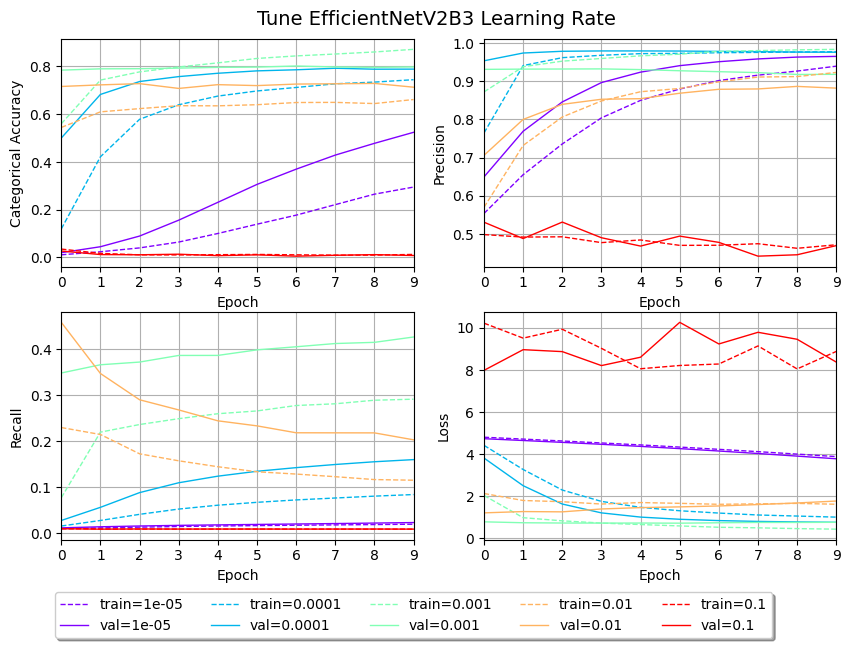

In [74]:
plot_performance(effnetB3_lr_scores, "Tune EfficientNetV2B3 Learning Rate", epochs)

In [75]:
effnetB3_learning_rate = 0.0001

### Tune inner layer

In [76]:
effnetB3_size_scores = {}

for size in [10, 50, 100, 250, 500, 1000]:
    print(size)

    model = make_model(effnetB3_base_model, input_size=299, learning_rate=effnetB3_learning_rate,size_inner=size)
    history = model.fit(effnetB3_train_ds, epochs=10, validation_data=effnetB3_val_ds)
    effnetB3_size_scores[size] = history.history

    print()
    print()

10
Epoch 1/10
412/412 [==============================] - 27s 50ms/step - loss: 4.7428 - categorical_accuracy: 0.0184 - precision_48: 0.0104 - recall_48: 0.5560 - val_loss: 4.6810 - val_categorical_accuracy: 0.0507 - val_precision_48: 0.0136 - val_recall_48: 0.6833
Epoch 2/10
412/412 [==============================] - 19s 47ms/step - loss: 4.6087 - categorical_accuracy: 0.0388 - precision_48: 0.0131 - recall_48: 0.6598 - val_loss: 4.5213 - val_categorical_accuracy: 0.0999 - val_precision_48: 0.0166 - val_recall_48: 0.7443
Epoch 3/10
412/412 [==============================] - 19s 46ms/step - loss: 4.4727 - categorical_accuracy: 0.0535 - precision_48: 0.0147 - recall_48: 0.6910 - val_loss: 4.3578 - val_categorical_accuracy: 0.1497 - val_precision_48: 0.0194 - val_recall_48: 0.7725
Epoch 4/10
412/412 [==============================] - 19s 46ms/step - loss: 4.3364 - categorical_accuracy: 0.0692 - precision_48: 0.0162 - recall_48: 0.7125 - val_loss: 4.1940 - val_categorical_accuracy: 0.1855 

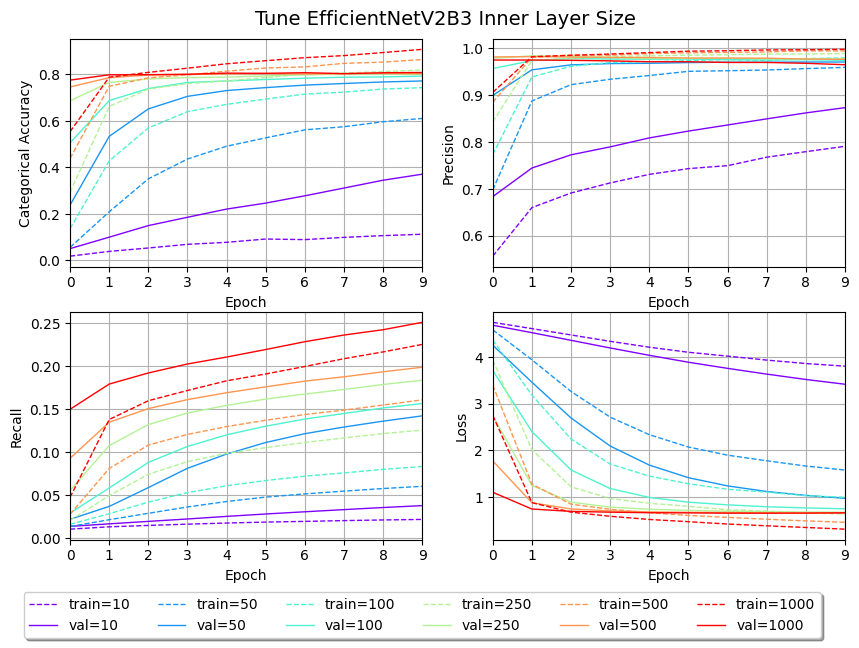

In [77]:
# lr 0.0001
plot_performance(effnetB3_size_scores, "Tune EfficientNetV2B3 Inner Layer Size", epochs)

In [78]:
effnetB3_size_inner = 250

### Tune dropout rate

In [79]:
effnetB3_drop_scores = {}

for drop in [0.25, 0.4, 0.5, 0.6, 0.75]:
    print(drop)

    model = make_model(effnetB3_base_model, input_size=299, learning_rate=effnetB3_learning_rate, size_inner=effnetB3_size_inner,droprate=drop)
    history = model.fit(effnetB3_train_ds, epochs=10, validation_data=effnetB3_val_ds)
    effnetB3_drop_scores[drop] = history.history

    print()
    print()

0.25
Epoch 1/10
412/412 [==============================] - 26s 50ms/step - loss: 3.6438 - categorical_accuracy: 0.4108 - precision_54: 0.0242 - recall_54: 0.8879 - val_loss: 2.2085 - val_categorical_accuracy: 0.7173 - val_precision_54: 0.0580 - val_recall_54: 0.9803
Epoch 2/10
412/412 [==============================] - 19s 46ms/step - loss: 1.4791 - categorical_accuracy: 0.7453 - precision_54: 0.0670 - recall_54: 0.9845 - val_loss: 1.0003 - val_categorical_accuracy: 0.7801 - val_precision_54: 0.1008 - val_recall_54: 0.9839
Epoch 3/10
412/412 [==============================] - 19s 46ms/step - loss: 0.9024 - categorical_accuracy: 0.7876 - precision_54: 0.0943 - recall_54: 0.9890 - val_loss: 0.8006 - val_categorical_accuracy: 0.7886 - val_precision_54: 0.1199 - val_recall_54: 0.9827
Epoch 4/10
412/412 [==============================] - 19s 46ms/step - loss: 0.7497 - categorical_accuracy: 0.8012 - precision_54: 0.1078 - recall_54: 0.9891 - val_loss: 0.7375 - val_categorical_accuracy: 0.789

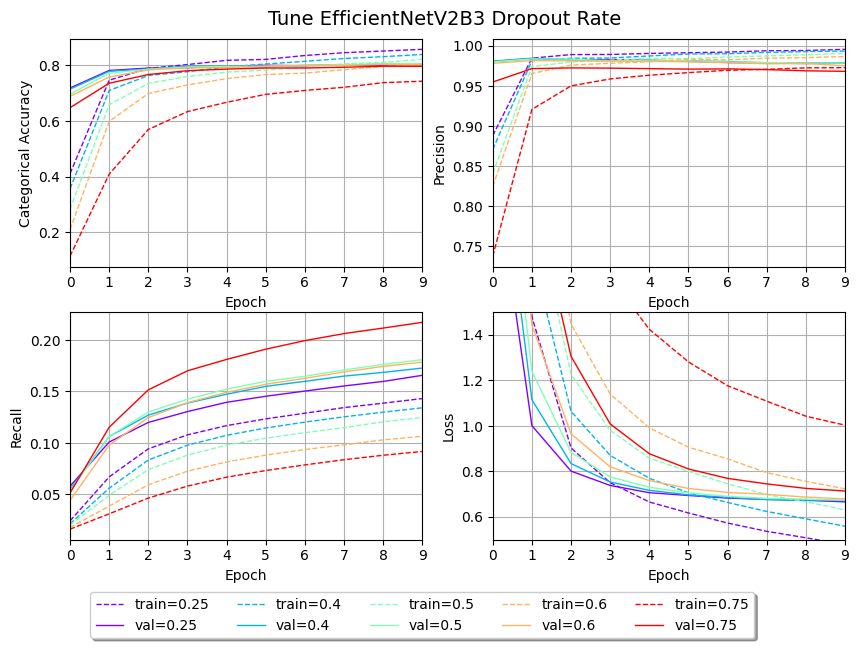

In [80]:
# size 250
plot_performance(effnetB3_drop_scores, "Tune EfficientNetV2B3 Dropout Rate", epochs, loss_lim = [0.5, 1.5])

In [81]:
effnetB3_droprate = 0.6

### Save best model

In [82]:
# image generator for final testing
effnetB3_train_ds_big = effnetB3_gen.flow(X_train_big, y_train_big_tf, batch_size=batch_size)
effnetB3_test_ds_big = effnetB3_gen.flow(X_val_big, y_val_big_tf, batch_size=batch_size)

In [83]:
# create model with begininng layers trainable
model = make_model(effnetB3_base_model, learning_rate=effnetB3_learning_rate, size_inner=effnetB3_size_inner, droprate=effnetB3_droprate)
model = unfreeze_model(model, learning_rate=effnetB3_learning_rate, num_layers=4)

# fit model to training data
effnetB3_train_history = model.fit(
    effnetB3_train_ds_big,
    epochs=50,
    validation_data=effnetB3_test_ds_big
)

Epoch 1/50
412/412 [==============================] - 55s 118ms/step - loss: 3.5625 - categorical_accuracy: 0.4190 - precision_60: 0.0235 - recall_60: 0.9021 - val_loss: 1.9442 - val_categorical_accuracy: 0.8773 - val_precision_60: 0.0925 - val_recall_60: 0.9985
Epoch 2/50
412/412 [==============================] - 47s 113ms/step - loss: 1.3345 - categorical_accuracy: 0.8196 - precision_60: 0.0679 - recall_60: 0.9941 - val_loss: 0.5611 - val_categorical_accuracy: 0.9229 - val_precision_60: 0.1876 - val_recall_60: 0.9988
Epoch 3/50
412/412 [==============================] - 47s 114ms/step - loss: 0.6621 - categorical_accuracy: 0.8734 - precision_60: 0.1075 - recall_60: 0.9966 - val_loss: 0.3261 - val_categorical_accuracy: 0.9295 - val_precision_60: 0.2300 - val_recall_60: 0.9985
Epoch 4/50
412/412 [==============================] - 47s 113ms/step - loss: 0.4653 - categorical_accuracy: 0.8963 - precision_60: 0.1324 - recall_60: 0.9961 - val_loss: 0.2581 - val_categorical_accuracy: 0.9332

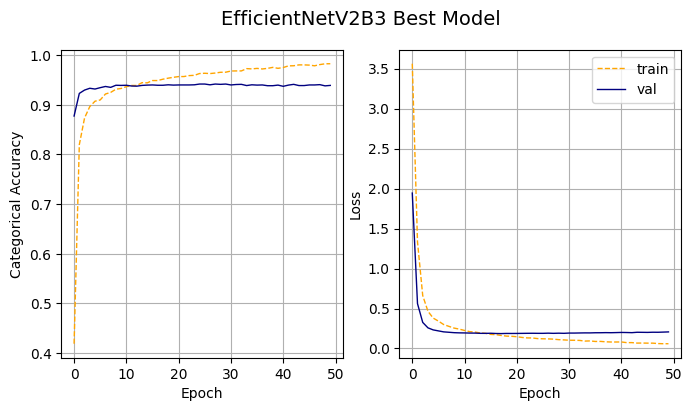

In [84]:
plot_best(effnetB3_train_history.history, title="EfficientNetV2B3 Best Model")

In [85]:
# performance metrics for model comparison
effnetB3_params = model.count_params()
effnetB3_epochs = np.argmax(effnetB3_train_history.history['val_categorical_accuracy'])
effnetB3_train_accuracy = effnetB3_train_history.history['categorical_accuracy'][effnetB3_epochs]
effnetB3_train_loss = effnetB3_train_history.history['loss'][effnetB3_epochs]
effnetB3_val_accuracy = effnetB3_train_history.history['val_categorical_accuracy'][effnetB3_epochs]
effnetB3_val_loss = effnetB3_train_history.history['val_loss'][effnetB3_epochs]

**Retrain model at tuned number of epochs to save**

In [86]:
# create new model
model = make_model(effnetB3_base_model, learning_rate=effnetB3_learning_rate, size_inner=effnetB3_size_inner, droprate=effnetB3_droprate)
model = unfreeze_model(model, learning_rate=effnetB3_learning_rate, num_layers=4)

# fit model to training data with tuned num of epochs to prevent overfitting
start = time()
model.fit(
    effnetB3_train_ds_big,
    epochs=effnetB3_epochs
)
effnetB3_train_time = time() - start
effnetB3_train_time = effnetB3_train_time/epochs

Epoch 1/24
412/412 [==============================] - 43s 91ms/step - loss: 3.5797 - categorical_accuracy: 0.4149 - precision_62: 0.0228 - recall_62: 0.8955
Epoch 2/24
412/412 [==============================] - 38s 92ms/step - loss: 1.3250 - categorical_accuracy: 0.8247 - precision_62: 0.0654 - recall_62: 0.9950
Epoch 3/24
412/412 [==============================] - 38s 92ms/step - loss: 0.6523 - categorical_accuracy: 0.8774 - precision_62: 0.1050 - recall_62: 0.9965
Epoch 4/24
412/412 [==============================] - 37s 91ms/step - loss: 0.4597 - categorical_accuracy: 0.8952 - precision_62: 0.1289 - recall_62: 0.9965
Epoch 5/24
412/412 [==============================] - 37s 91ms/step - loss: 0.3820 - categorical_accuracy: 0.9081 - precision_62: 0.1446 - recall_62: 0.9964
Epoch 6/24
412/412 [==============================] - 37s 91ms/step - loss: 0.3375 - categorical_accuracy: 0.9136 - precision_62: 0.1579 - recall_62: 0.9967
Epoch 7/24
412/412 [==============================] - 37s 

In [87]:
# save model
path = os.path.join('..', 'models', 'effnetV2B3_model.keras')
model.save(path)
#tf.saved_model.save(model, path)

# model size in mb
effnetB3_size = os.stat(path).st_size / (1024 * 1024)

### Final prediction

In [88]:
# load model
path = os.path.join('..', 'models', 'effnetV2B3_model.keras')
effnetB3_model = keras.models.load_model(path)

In [89]:
# image generator with held-out training data for test data prediction
effnetB3_test_ds_big = effnetB3_gen.flow(X_test_big, y_test_big_tf, batch_size=batch_size,shuffle=False)

# compute testing statistics
start = time()
effnetB3_test_predict = effnetB3_model.predict(effnetB3_test_ds_big)
effnetB3_predict_time = time() - start

effnetB3_test_predict = np.argmax(effnetB3_test_predict, axis=1)
effnetB3_accuracy, effnetB3_precision, effnetB3_recall, effnetB3_f1 = accuracy_score(effnetB3_test_predict, y_test_big), precision_score(effnetB3_test_predict, y_test_big, average='macro'), recall_score(effnetB3_test_predict, y_test_big, average='macro'), f1_score(effnetB3_test_predict, y_test_big, average='macro')

129/129 [==============================] - 16s 95ms/step


In [90]:
new_line = "\n"
print(
    f"--- EfficientNetV2B3 Final Info and Statistics ---{new_line}"
    f"-- Tuned parameters --{new_line}"
    f"learning rate: {effnetB3_learning_rate}{new_line}"
    f"inner layer size: {effnetB3_size_inner}{new_line}"
    f"dropout rate: {effnetB3_droprate}{new_line}"
    f"epochs: {effnetB3_epochs+1}{new_line}{new_line}"

    f"-- Model info --{new_line}"
    f"model size: {effnetB3_size:,.3f}{new_line}"
    f"number of parameters: {effnetB3_params}{new_line}{new_line}"

    f"-- Model statistics --{new_line}"
    f"avg train time: {effnetB3_train_time:,.3f}{new_line}"
    f"predict time: {effnetB3_predict_time:,.3f}{new_line}{new_line}"

    f"training accuracy: {effnetB3_train_accuracy:,.3f}{new_line}"
    f"training loss: {effnetB3_train_loss:,.3f}{new_line}{new_line}"
 
    f"validation accuracy: {effnetB3_val_accuracy:,.3f}{new_line}"
    f"validation loss: {effnetB3_val_loss:,.3f}{new_line}{new_line}"
 
    f"test accuracy: {effnetB3_accuracy:,.3f}{new_line}"
    f"test precision: {effnetB3_precision:,.3f}{new_line}"
    f"test recall: {effnetB3_recall:,.3f}{new_line}"
    f"test f1: {effnetB3_f1:,.3f}{new_line}"
)

--- EfficientNetV2B3 Final Info and Statistics ---
-- Tuned parameters --
learning rate: 0.0001
inner layer size: 250
dropout rate: 0.6
epochs: 25

-- Model info --
model size: 54.715
number of parameters: 13344992

-- Model statistics --
avg train time: 90.807
predict time: 15.979

training accuracy: 0.963
training loss: 0.123

validation accuracy: 0.942
validation loss: 0.190

test accuracy: 0.942
test precision: 0.941
test recall: 0.941
test f1: 0.940



## 4.5 Model 4. ConvNeXtSmall

[ConvNeXtSmall Application - Keras](https://keras.io/api/applications/convnext/#convnextsmall-function)

**Reference**
- [A ConvNet for the 2020s](https://arxiv.org/abs/2201.03545) (CVPR 2022)

**Base Model Architecture**

ConvNeXt is a family of architectures that aims to make transformers viable for computer vision, aiding in tasks suck as object detection and semantic segmentation. They outperform other transformers while maintaining the simplicity and efficiency of standard ConvNets. Table 9 from the paper shows the architecture for ConvNeXt-T compared with ResNet-50 () and Swin-T (Ze et al, 2021)[https://arxiv.org/abs/2103.14030]. For differently sized ConvNeXts, only the number of blocks and the number of channels at each stage differ from ConvNeXt-T. The number of channels doubles at each new stage, so ConvNeXt-Small has double the number of channels.

<img src="../figures/convnextsmall-table.PNG" width="500">

In [92]:
convNeXtSm_base_model = tf.keras.applications.convnext.ConvNeXtSmall(
        weights='imagenet',
        include_top=False,
        input_shape=(299, 299, 3)
    )
epochs=10
batch_size=32

In [93]:
# image generator for preprocessing
convNeXtSm_gen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.convnext.preprocess_input)
convNeXtSm_train_ds = convNeXtSm_gen.flow(X_train, y_train_tf, batch_size=batch_size)
convNeXtSm_val_ds = convNeXtSm_gen.flow(X_val, y_val_tf, batch_size=batch_size)

In [ ]:
model = make_model(convNeXtSm_base_model)
model.summary(expand_nested=True)

### Tune learning rate

In [95]:
convNeXtSm_lr_scores = {}

for lr in [0.00001, 0.0001, 0.001, 0.01, 0.1]:
    print(lr)

    model = make_model(convNeXtSm_base_model, learning_rate=lr)
    history = model.fit(convNeXtSm_train_ds, epochs=epochs, validation_data=convNeXtSm_val_ds)
    convNeXtSm_lr_scores[lr] = history.history

    print()
    print()

1e-05
Epoch 1/10
412/412 [==============================] - 78s 163ms/step - loss: 5.1439 - categorical_accuracy: 0.0096 - precision_64: 0.0092 - recall_64: 0.5262 - val_loss: 4.7769 - val_categorical_accuracy: 0.0152 - val_precision_64: 0.0109 - val_recall_64: 0.5873
Epoch 2/10
412/412 [==============================] - 64s 154ms/step - loss: 4.8799 - categorical_accuracy: 0.0187 - precision_64: 0.0109 - recall_64: 0.6041 - val_loss: 4.5506 - val_categorical_accuracy: 0.0410 - val_precision_64: 0.0133 - val_recall_64: 0.6896
Epoch 3/10
412/412 [==============================] - 64s 154ms/step - loss: 4.6557 - categorical_accuracy: 0.0330 - precision_64: 0.0125 - recall_64: 0.6734 - val_loss: 4.3386 - val_categorical_accuracy: 0.0899 - val_precision_64: 0.0155 - val_recall_64: 0.7659
Epoch 4/10
412/412 [==============================] - 63s 154ms/step - loss: 4.4464 - categorical_accuracy: 0.0565 - precision_64: 0.0141 - recall_64: 0.7350 - val_loss: 4.1344 - val_categorical_accuracy: 

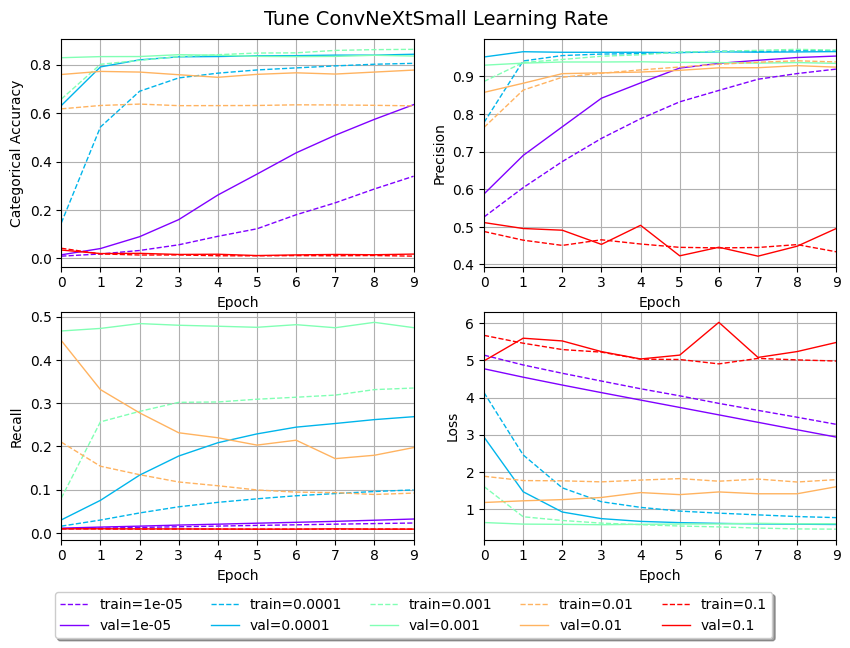

In [96]:
plot_performance(convNeXtSm_lr_scores, "Tune ConvNeXtSmall Learning Rate", epochs)

In [97]:
convNeXtSm_learning_rate = 0.0001

### Tune inner layer

In [98]:
convNeXtSm_size_scores = {}

for size in [10, 50, 100, 250, 500, 1000]:
    print(size)

    model=make_model(convNeXtSm_base_model, learning_rate=convNeXtSm_learning_rate, size_inner=size)
    history = model.fit(convNeXtSm_train_ds, epochs=10, validation_data=convNeXtSm_val_ds)
    convNeXtSm_size_scores[size] = history.history

    print()
    print()

10
Epoch 1/10
412/412 [==============================] - 75s 160ms/step - loss: 4.7196 - categorical_accuracy: 0.0204 - precision_69: 0.0106 - recall_69: 0.5621 - val_loss: 4.5674 - val_categorical_accuracy: 0.0619 - val_precision_69: 0.0148 - val_recall_69: 0.7379
Epoch 2/10
412/412 [==============================] - 63s 153ms/step - loss: 4.5017 - categorical_accuracy: 0.0484 - precision_69: 0.0135 - recall_69: 0.6759 - val_loss: 4.3174 - val_categorical_accuracy: 0.1588 - val_precision_69: 0.0187 - val_recall_69: 0.8026
Epoch 3/10
412/412 [==============================] - 64s 155ms/step - loss: 4.2979 - categorical_accuracy: 0.0705 - precision_69: 0.0156 - recall_69: 0.7018 - val_loss: 4.0451 - val_categorical_accuracy: 0.2162 - val_precision_69: 0.0233 - val_recall_69: 0.8233
Epoch 4/10
412/412 [==============================] - 63s 154ms/step - loss: 4.1103 - categorical_accuracy: 0.0828 - precision_69: 0.0180 - recall_69: 0.7237 - val_loss: 3.7942 - val_categorical_accuracy: 0.2

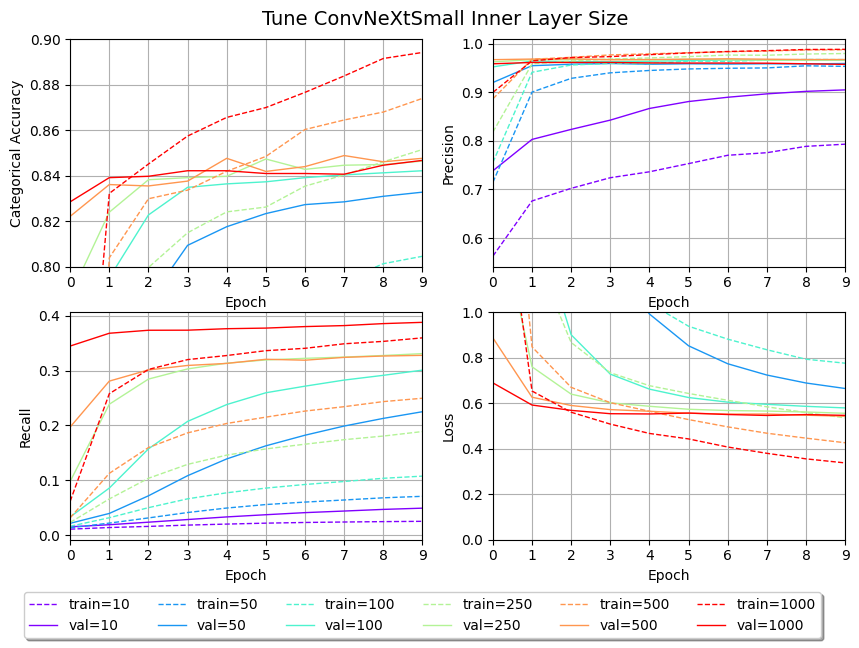

In [99]:
plot_performance(convNeXtSm_size_scores, "Tune ConvNeXtSmall Inner Layer Size", epochs, acc_lim = [0.8,0.9], loss_lim=[0,1])

In [100]:
convNeXtSm_size_inner = 250

### Tune dropout rate

In [101]:
convNeXtSm_drop_scores = {}

for drop in [0.25, 0.4, 0.5, 0.6, 0.75]:
    print(drop)

    model=make_model(convNeXtSm_base_model, learning_rate=convNeXtSm_learning_rate, size_inner=convNeXtSm_size_inner, droprate=drop)
    history = model.fit(convNeXtSm_train_ds, epochs=10, validation_data=convNeXtSm_val_ds)
    convNeXtSm_drop_scores[drop] = history.history

    print()
    print()

0.25
Epoch 1/10
412/412 [==============================] - 75s 159ms/step - loss: 2.9089 - categorical_accuracy: 0.4776 - precision_75: 0.0258 - recall_75: 0.8823 - val_loss: 1.1684 - val_categorical_accuracy: 0.8135 - val_precision_75: 0.0887 - val_recall_75: 0.9724
Epoch 2/10
412/412 [==============================] - 63s 154ms/step - loss: 0.9025 - categorical_accuracy: 0.8124 - precision_75: 0.0898 - recall_75: 0.9737 - val_loss: 0.6851 - val_categorical_accuracy: 0.8345 - val_precision_75: 0.1815 - val_recall_75: 0.9718
Epoch 3/10
412/412 [==============================] - 63s 154ms/step - loss: 0.6598 - categorical_accuracy: 0.8320 - precision_75: 0.1356 - recall_75: 0.9757 - val_loss: 0.6111 - val_categorical_accuracy: 0.8397 - val_precision_75: 0.2226 - val_recall_75: 0.9724
Epoch 4/10
412/412 [==============================] - 63s 154ms/step - loss: 0.5760 - categorical_accuracy: 0.8456 - precision_75: 0.1633 - recall_75: 0.9782 - val_loss: 0.5880 - val_categorical_accuracy: 0

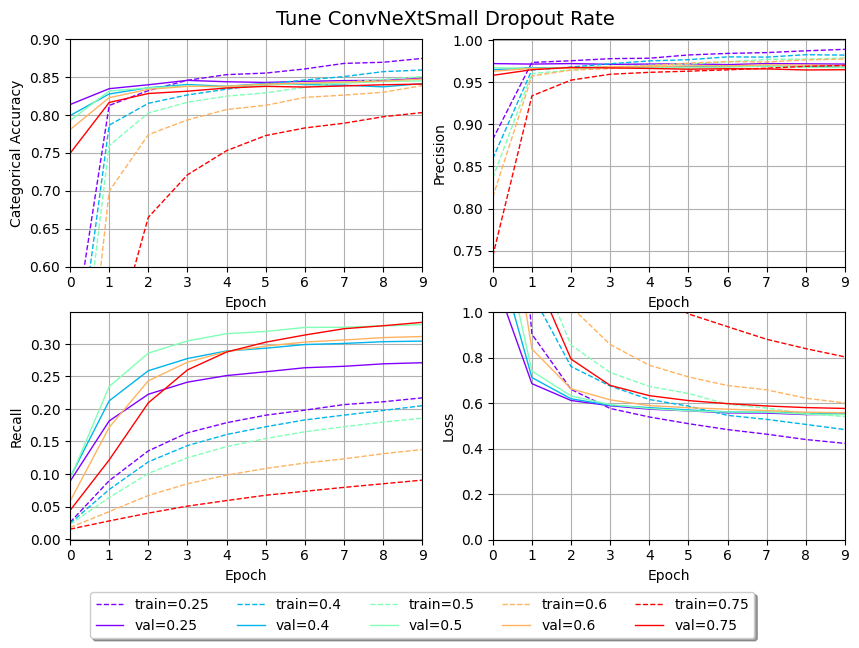

In [102]:
plot_performance(convNeXtSm_drop_scores, "Tune ConvNeXtSmall Dropout Rate", epochs, acc_lim=[0.6,0.9], loss_lim = [0,1])

In [103]:
convNeXtSm_droprate = 0.6

### Save best model

In [104]:
# image generator for epoch tuning and final learning curve analysis
convNeXtSm_train_ds_big = convNeXtSm_gen.flow(X_train_big, y_train_big_tf, batch_size=batch_size)
convNeXtSm_test_ds_big = convNeXtSm_gen.flow(X_val_big, y_val_big_tf, batch_size=batch_size)

In [105]:
# create model with begininng layers trainable
model = make_model(convNeXtSm_base_model, learning_rate=convNeXtSm_learning_rate, size_inner=convNeXtSm_size_inner, droprate=convNeXtSm_droprate)
model = unfreeze_model(model, learning_rate=convNeXtSm_learning_rate, num_layers=4)

# fit model to training data
convNeXtSm_train_history = model.fit(
    convNeXtSm_train_ds_big,
    epochs=50,
    validation_data=convNeXtSm_test_ds_big
)

Epoch 1/50
412/412 [==============================] - 206s 474ms/step - loss: 4.0132 - categorical_accuracy: 0.1954 - precision_81: 0.0188 - recall_81: 0.7729 - val_loss: 2.4885 - val_categorical_accuracy: 0.8433 - val_precision_81: 0.1643 - val_recall_81: 0.9730
Epoch 2/50
412/412 [==============================] - 191s 463ms/step - loss: 1.8275 - categorical_accuracy: 0.7093 - precision_81: 0.1001 - recall_81: 0.9398 - val_loss: 0.8085 - val_categorical_accuracy: 0.9201 - val_precision_81: 0.5825 - val_recall_81: 0.9730
Epoch 3/50
412/412 [==============================] - 191s 464ms/step - loss: 0.9090 - categorical_accuracy: 0.8466 - precision_81: 0.2536 - recall_81: 0.9591 - val_loss: 0.4497 - val_categorical_accuracy: 0.9289 - val_precision_81: 0.6095 - val_recall_81: 0.9769
Epoch 4/50
412/412 [==============================] - 191s 464ms/step - loss: 0.6411 - categorical_accuracy: 0.8730 - precision_81: 0.3151 - recall_81: 0.9656 - val_loss: 0.3447 - val_categorical_accuracy: 0.

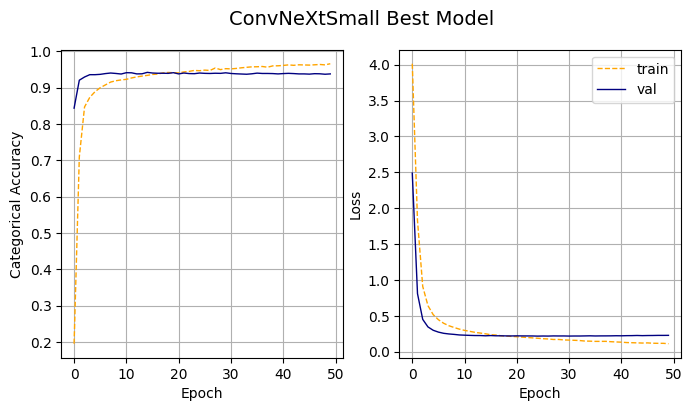

In [106]:
plot_best(convNeXtSm_train_history.history, title="ConvNeXtSmall Best Model")

In [107]:
# performance metrics for model comparison
convNeXtSm_params = model.count_params()
convNeXtSm_epochs = np.argmax(convNeXtSm_train_history.history['val_categorical_accuracy'])
convNeXtSm_train_accuracy = convNeXtSm_train_history.history['categorical_accuracy'][convNeXtSm_epochs]
convNeXtSm_train_loss = convNeXtSm_train_history.history['loss'][convNeXtSm_epochs]
convNeXtSm_val_accuracy = convNeXtSm_train_history.history['val_categorical_accuracy'][convNeXtSm_epochs]
convNeXtSm_val_loss = convNeXtSm_train_history.history['val_loss'][convNeXtSm_epochs]

**Retrain model at tuned number of epochs to save**

In [108]:
# create new model
model = make_model(convNeXtSm_base_model, learning_rate=convNeXtSm_learning_rate, size_inner=convNeXtSm_size_inner, droprate=convNeXtSm_droprate)
model = unfreeze_model(model, learning_rate=convNeXtSm_learning_rate, num_layers=4)

# fit model to training data with tuned num of epochs to prevent overfitting
start = time()
model.fit(
    convNeXtSm_train_ds_big,
    epochs=convNeXtSm_epochs
)
convNeXtSm_train_time = time() - start
convNeXtSm_train_time = convNeXtSm_train_time/epochs

Epoch 1/14
412/412 [==============================] - 163s 370ms/step - loss: 4.0657 - categorical_accuracy: 0.1815 - precision_83: 0.0182 - recall_83: 0.7716
Epoch 2/14
412/412 [==============================] - 152s 369ms/step - loss: 1.9002 - categorical_accuracy: 0.6979 - precision_83: 0.0815 - recall_83: 0.9423
Epoch 3/14
412/412 [==============================] - 152s 370ms/step - loss: 0.9531 - categorical_accuracy: 0.8374 - precision_83: 0.2036 - recall_83: 0.9617
Epoch 4/14
412/412 [==============================] - 152s 369ms/step - loss: 0.6574 - categorical_accuracy: 0.8749 - precision_83: 0.2673 - recall_83: 0.9689
Epoch 5/14
412/412 [==============================] - 152s 369ms/step - loss: 0.5218 - categorical_accuracy: 0.8913 - precision_83: 0.2972 - recall_83: 0.9736
Epoch 6/14
412/412 [==============================] - 152s 370ms/step - loss: 0.4450 - categorical_accuracy: 0.9049 - precision_83: 0.3157 - recall_83: 0.9800
Epoch 7/14
412/412 [==========================

In [109]:
# save model
path = os.path.join('..', 'models', 'convNeXtSm_model.keras')
model.save(path)

# model size in mb
convNeXtSm_size = os.stat(path).st_size / (1024 * 1024)

### Final prediction

In [110]:
path = os.path.join('..', 'models', 'convNeXtSm_model.keras')
convNeXtSm_model = tf.keras.models.load_model(path, compile=False, custom_objects={ "LayerScale": convnext.LayerScale, "StochasticDepth": convnext.StochasticDepth } )

In [111]:
# image generator with held-out training data for test data prediction
convNeXtSm_train_hold_ds_big = convNeXtSm_gen.flow(X_train_big_hold, y_train_big_hold_tf, batch_size=batch_size,shuffle=False)
convNeXtSm_test_ds_big = convNeXtSm_gen.flow(X_test_big, y_test_big_tf, batch_size=batch_size,shuffle=False)

In [112]:
# compute testing statistics
start = time()
convNeXtSm_test_predict = convNeXtSm_model.predict(convNeXtSm_test_ds_big)
convNeXtSm_predict_time = time() - start

convNeXtSm_test_predict = np.argmax(convNeXtSm_test_predict, axis=1)
convNeXtSm_accuracy, convNeXtSm_precision, convNeXtSm_recall, convNeXtSm_f1 = accuracy_score(convNeXtSm_test_predict, y_test_big), precision_score(convNeXtSm_test_predict, y_test_big, average='macro'), recall_score(convNeXtSm_test_predict, y_test_big, average='macro'), f1_score(convNeXtSm_test_predict, y_test_big, average='macro')

129/129 [==============================] - 50s 371ms/step


In [114]:
new_line = "\n"
print(
    f"--- ConvNeXtSmall Final Info and Statistics ---{new_line}"
    f"-- Tuned parameters --{new_line}"
    f"learning rate: {convNeXtSm_learning_rate}{new_line}"
    f"inner layer size: {convNeXtSm_size_inner}{new_line}"
    f"dropout rate: {convNeXtSm_droprate}{new_line}"
    f"epochs: {convNeXtSm_epochs+1}{new_line}{new_line}"

    f"-- Model info --{new_line}"
    f"model size: {convNeXtSm_size:,.3f}{new_line}"
    f"number of parameters: {convNeXtSm_params}{new_line}{new_line}"

    f"-- Model statistics --{new_line}"
    f"avg train time: {convNeXtSm_train_time:,.3f}{new_line}"
    f"predict time: {convNeXtSm_predict_time:,.3f}{new_line}{new_line}"

    f"training accuracy: {convNeXtSm_train_accuracy:,.3f}{new_line}"
    f"training loss: {convNeXtSm_train_loss:,.3f}{new_line}{new_line}"
 
    f"validation accuracy: {convNeXtSm_val_accuracy:,.3f}{new_line}"
    f"validation loss: {convNeXtSm_val_loss:,.3f}{new_line}{new_line}"
 
    f"test accuracy: {convNeXtSm_accuracy:,.3f}{new_line}"
    f"test precision: {convNeXtSm_precision:,.3f}{new_line}"
    f"test recall: {convNeXtSm_recall:,.3f}{new_line}"
    f"test f1: {convNeXtSm_f1:,.3f}{new_line}"
)

--- ConvNeXtSmall Final Info and Statistics ---
-- Tuned parameters --
learning rate: 0.0001
inner layer size: 250
dropout rate: 0.6
epochs: 15

-- Model info --
model size: 191.716
number of parameters: 49677058

-- Model statistics --
avg train time: 214.097
predict time: 50.604

training accuracy: 0.933
training loss: 0.249

validation accuracy: 0.942
validation loss: 0.221

test accuracy: 0.940
test precision: 0.938
test recall: 0.941
test f1: 0.938



## 4.6 Compare all models

EfficientNetB3V2 is our best performing model across all metrics. It also has the smallest size and a relatively small number of parameters, so we can assume it will run fairly fast.

In [115]:
df = pl.DataFrame(
    {
        'Model': ['Xception', 'InceptionResNetV2', 'EfficientNetB3', 'ConvNeXtSmall'],
        'Learning rate': [xception_learning_rate, inception_learning_rate, effnetB3_learning_rate, convNeXtSm_learning_rate],
        'Inner layer size': [xception_size_inner, inception_size_inner, effnetB3_size_inner, convNeXtSm_size_inner],
        'Dropout rate': [xception_droprate, inception_droprate, effnetB3_droprate, convNeXtSm_droprate],
        'Epochs': [xception_epochs, inception_epochs, effnetB3_epochs, convNeXtSm_epochs],

        'Model size (MB)': [xception_size, inception_size, effnetB3_size, convNeXtSm_size],
        'Parameters': [xception_params, inception_params, effnetB3_params, convNeXtSm_params],

        'Train Accuracy': [xception_train_accuracy, inception_train_accuracy, effnetB3_train_accuracy, convNeXtSm_train_accuracy],
        'Train Loss': [xception_train_loss, inception_train_loss, effnetB3_train_loss, convNeXtSm_train_loss],
        
        'Validation Accuracy': [xception_val_accuracy, inception_val_accuracy, effnetB3_val_accuracy, convNeXtSm_val_accuracy],
        'Validation Loss': [xception_val_loss, inception_val_loss, effnetB3_val_loss, convNeXtSm_val_loss],
        
        'Test Accuracy': [xception_accuracy, inception_accuracy, effnetB3_accuracy, convNeXtSm_accuracy],
        'Test Precision': [xception_precision, inception_precision, effnetB3_precision, convNeXtSm_precision],
        'Test Recall': [xception_recall, inception_recall, effnetB3_recall, convNeXtSm_recall],
        'Test f1': [xception_f1, inception_f1, effnetB3_f1, convNeXtSm_f1]
    }
)

In [116]:
pl.Config(tbl_hide_dataframe_shape=True, tbl_hide_column_data_types=True, fmt_str_lengths=20)

In [117]:
df

Model,Learning rate,Inner layer size,Dropout rate,Epochs,Model size (MB),Parameters,Train Accuracy,Train Loss,Validation Accuracy,Validation Loss,Test Accuracy,Test Precision,Test Recall,Test f1
"""Xception""",0.0001,100,0.4,27,82.332954,21078500,0.90965,0.301383,0.900395,0.325426,0.904519,0.90398,0.903602,0.901679
"""InceptionResNetV2""",0.0001,100,0.4,16,210.37339,54502556,0.912383,0.30849,0.919526,0.279844,0.919825,0.918264,0.92056,0.917525
"""EfficientNetB3""",0.0001,250,0.6,24,54.714813,13344992,0.962873,0.123421,0.941694,0.189512,0.942177,0.940577,0.940898,0.939725
"""ConvNeXtSmall""",0.0001,250,0.6,14,191.715981,49677058,0.933414,0.24865,0.941694,0.220839,0.939504,0.938094,0.941052,0.937844


# 5. References

1. Chollet, François (2016). _“xception: Deep Learning with Depthwise Separable Convolutions”_. In: CoRR abs/1610.02357. arXiv: 1610.02357. url: [http://
arxiv.org/abs/1610.02357](http://arxiv.org/abs/1610.02357).

2. Szegedy, Christian, Ioffe, Sergey, and Vanhoucke, Vincent (2016). _“Inception-v4, Inception-ResNet and the Impact of Residual Connections on Learning”_. In: CoRR abs/1602.07261. arXiv: 1602.07261. url: [http://arxiv.org/abs/1602.07261](https://arxiv.org/abs/1602.07261).
   
3. Sandler, Mark, Howard, Andrew G., Zhu, Menglong, Zhmoginov, Andrey, and Chen, Liang-Chieh (2018). _“Inverted Residuals and Linear Bottlenecks: Mobile Networks for Classification, Detection and Segmentation”_. In: CoRR abs/1801.04381. arXiv: 1801 . 04381. url: [https://arxiv.org/abs/1801.04381](https://arxiv.org/abs/1801.04381).
   
4. Tan, Mingxing, Chen, Bo, Pang, Ruoming, Vasudevan, Vijay, Sandler, Mark, Howard, Andrew, and Le, Quoc V. (2019). _MnasNet: Platform-Aware Neural Architecture Search for Mobile_. arXiv: [1807.11626 \[cs.CV\]](https://arxiv.org/abs/1807.11626).

5. Tan, Mingxing and Le, Quoc V. (2020). _EfficientNet: Rethinking Model Scaling for Convolutional Neural Networks_. arXiv: [1905.11946 \[cs.LG\]](https://arxiv.org/abs/1905.11946).

6. Liu, Ze, Lin, Yutong, Cao, Yue, Hu, Han, Wei, Yixuan, Zhang, Zheng, Lin, Stephen, and Guo, Baining (2021). _Swin Transformer: Hierarchical Vision Transformer using Shifted Windows_. arXiv: [2103.14030 \[cs.CV\]](https://arxiv.org/abs/2103.14030).

7. Liu, Zhuang, Mao, Hanzi, Wu, Chao-Yuan, Feichtenhofer, Christoph, Darrell, Trevor, and Xie, Saining (2022). _“A ConvNet for the 2020s”_. In: CoRR abs/2201.03545. arXiv: 2201 . 03545. url: [https://arxiv.org/abs/2201.03545](https://arxiv.org/abs/2201.03545)

8. Aditya Khosla, Nityananda Jayadevaprakash, Bangpeng Yao and Li Fei-Fei. Novel dataset for Fine-Grained Image Categorization. First Workshop on Fine-Grained Visual Categorization (FGVC), IEEE Conference on Computer Vision and Pattern Recognition (CVPR), 2011.

9. J. Deng, W. Dong, R. Socher, L.-J. Li, K. Li and L. Fei-Fei, ImageNet: A Large-Scale Hierarchical Image Database. IEEE Computer Vision and Pattern Recognition (CVPR), 2009.
    
10. Fu, Y. (2020, June 30). Keras documentation: Image Classification via fine-tuning with EfficientNet. [https://keras.io/examples/vision/image_classification_efficientnet_fine_tuning/](https://keras.io/examples/vision/image_classification_efficientnet_fine_tuning/)